**Para usar este archivo se deben de cargar inicialmente todos los archivos .json. A continuación puede ser ejecutado por completo y concluirá con la generación de dos archivos.csv con los datos unificados, limpios y analizados. También se generarán archivos .csv para cada uno de los documentos individuales por si fuera necesario su uso para algún análisis y archivos .pkl.**

# **1. TRANSFORMACIÓN DE DATOS DE JSON A CSV**

In [1]:
#Cargamos las librerías que vamos a necesitar para todo el archivo.
import pandas as pd
import numpy as np
import json
from pandas import json_normalize
import pickle
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from google.colab import files

##1.1. Tipo

In [2]:
#Cargamos los datos del archivo Json en un objeto Python para poder trabajar con ellos
with open('tipo.json', 'r') as json_file:
    data_tipo = json.load(json_file)

In [3]:
#Visualizamos los datos, tenemos los datos en forma de diccionario, que incluye una lista para cada
#tipo de fruta con otro diccionario para las claves:valor de t_id, tipo y tiempo_recogida.
data_tipo

{'Apple': [{'t_id': 'Apple 1.png', 'tipo': 'Apple', 'tiempo_recogida': 433},
  {'t_id': 'Apple 10.png', 'tipo': 'Apple', 'tiempo_recogida': 252},
  {'t_id': 'Apple 100.png', 'tipo': 'Apple', 'tiempo_recogida': 442},
  {'t_id': 'Apple 101.png', 'tipo': 'Apple', 'tiempo_recogida': 647},
  {'t_id': 'Apple 102.png', 'tipo': 'Apple', 'tiempo_recogida': 418},
  {'t_id': 'Apple 103.png', 'tipo': 'Apple', 'tiempo_recogida': 180},
  {'t_id': 'Apple 104.png', 'tipo': 'Apple', 'tiempo_recogida': 437},
  {'t_id': 'Apple 105.png', 'tipo': 'Apple', 'tiempo_recogida': 422},
  {'t_id': 'Apple 106.png', 'tipo': 'Apple', 'tiempo_recogida': 637},
  {'t_id': 'Apple 107.png', 'tipo': 'Apple', 'tiempo_recogida': 285},
  {'t_id': 'Apple 108.png', 'tipo': 'Apple', 'tiempo_recogida': 125},
  {'t_id': 'Apple 109.png', 'tipo': 'Apple', 'tiempo_recogida': 317},
  {'t_id': 'Apple 11.png', 'tipo': 'Apple', 'tiempo_recogida': 410},
  {'t_id': 'Apple 110.png', 'tipo': 'Apple', 'tiempo_recogida': 292},
  {'t_id': 'App

In [4]:
#Convertimos en dataframe, estamos sacacando un diccionario y nos aparece ahora cada tipo de fruta
#con una lista y su información contenida dentro de un diccionario a su vez.
df_data_tipo = pd.json_normalize(data_tipo, record_path=None).T
df_data_tipo

,0
Apple,"[{'t_id': 'Apple 1.png', 'tipo': 'Apple', 'tie..."
Banana,"[{'t_id': '71Banana02034.png', 'tipo': 'Banana..."
Carambola,"[{'t_id': 'Carambola 001.png', 'tipo': 'Caramb..."
Guava,"[{'t_id': 'cene00001.png', 'tipo': 'Guava', 't..."
Kiwi,"[{'t_id': 'Kiwi A001.png', 'tipo': 'Kiwi', 'ti..."
Mango,"[{'t_id': 'Mango001.png', 'tipo': 'Mango', 'ti..."
muskmelon,"[{'t_id': 'Muskmelon 001.png', 'tipo': 'muskme..."
Orange,"[{'t_id': 'Orange001.png', 'tipo': 'Orange', '..."
Peach,"[{'t_id': 'Peach001.png', 'tipo': 'Peach', 'ti..."
Pear,"[{'t_id': 'Pear 1.png', 'tipo': 'Pear', 'tiemp..."


In [5]:
#Observamos que tenemos 15 tipos de fruta pero la información está contenida en una sola columna.
df_data_tipo.shape

(15, 1)

In [6]:
df_data_tipo.index

Index(['Apple', 'Banana', 'Carambola', 'Guava', 'Kiwi', 'Mango', 'muskmelon',
       'Orange', 'Peach', 'Pear', 'Persimmon', 'Pitaya', 'Plum', 'Pomegranate',
       'Tomatoes'],
      dtype='object')

In [7]:
#Al usar .explode podemos ver la información de cada tipo de fruta en varias filas.
df_data_tipo = df_data_tipo.explode(0)
df_data_tipo

,0
Apple,"{'t_id': 'Apple 1.png', 'tipo': 'Apple', 'tiem..."
Apple,"{'t_id': 'Apple 10.png', 'tipo': 'Apple', 'tie..."
Apple,"{'t_id': 'Apple 100.png', 'tipo': 'Apple', 'ti..."
Apple,"{'t_id': 'Apple 101.png', 'tipo': 'Apple', 'ti..."
Apple,"{'t_id': 'Apple 102.png', 'tipo': 'Apple', 'ti..."
...,...
Tomatoes,"{'t_id': 'Tamotoes00995.png', 'tipo': 'Tomatoe..."
Tomatoes,"{'t_id': 'Tamotoes00996.png', 'tipo': 'Tomatoe..."
Tomatoes,"{'t_id': 'Tamotoes00997.png', 'tipo': 'Tomatoe..."
Tomatoes,"{'t_id': 'Tamotoes00998.png', 'tipo': 'Tomatoe..."


In [8]:
#Nuestros datos estan dentro de un diccionario así que volvemos a usar json_normalize para aplanar más los datos.
#Ahora aparecen en tres columnas por lo que podemos convertirlos en .csv.
df_data_tipo = pd.json_normalize(df_data_tipo[0])
df_data_tipo

,t_id,tipo,tiempo_recogida
0,Apple 1.png,Apple,433
1,Apple 10.png,Apple,252
2,Apple 100.png,Apple,442
3,Apple 101.png,Apple,647
4,Apple 102.png,Apple,418
...,...,...,...
70544,Tamotoes00995.png,Tomatoes,614
70545,Tamotoes00996.png,Tomatoes,433
70546,Tamotoes00997.png,Tomatoes,432
70547,Tamotoes00998.png,Tomatoes,497


In [9]:
df_data_tipo.shape

(70549, 3)

In [10]:
#Pasamos nuestro df a un documento csv para poder descargarlo.
df_data_tipo.to_csv('tipo_original.csv',sep=';')

##1.2. Lotes

In [11]:
#Observamos que nuestros datos aparecen en un diccionario con el t_id de clave y el codigo_lote de valor.
with open('lotes.json', 'r') as f:
    data_lotes = json.load(f)
data_lotes

{'Apple 1.png': 'G80V76K49J80T71',
 'Apple 10.png': 'G80V76K49L46V78M',
 'Apple 100.png': 'G80V76K49L48J80T71',
 'Apple 101.png': 'G80V76K49L49J80T71',
 'Apple 102.png': 'G80V76K49L50J80T71',
 'Apple 103.png': 'G80V76K49L51J80T71',
 'Apple 104.png': 'G80V76K49L52J80T71',
 'Apple 105.png': 'G80V76K49L53J80T71',
 'Apple 106.png': 'G80V76K49L54J80T71',
 'Apple 107.png': 'G80V76K49L55J80T71',
 'Apple 108.png': 'G80V76K49L56J80T71',
 'Apple 109.png': 'G80V76K49L57J80T71',
 'Apple 11.png': 'G80V76K49M46V78M',
 'Apple 110.png': 'G80V76K49M48J80T71',
 'Apple 111.png': 'G80V76K49M49J80T71',
 'Apple 112.png': 'G80V76K49M50J80T71',
 'Apple 113.png': 'G80V76K49M51J80T71',
 'Apple 114.png': 'G80V76K49M52J80T71',
 'Apple 115.png': 'G80V76K49M53J80T71',
 'Apple 116.png': 'G80V76K49M54J80T71',
 'Apple 117.png': 'G80V76K49M55J80T71',
 'Apple 118.png': 'G80V76K49M56J80T71',
 'Apple 119.png': 'G80V76K49M57J80T71',
 'Apple 12.png': 'G80V76K49N46V78M',
 'Apple 120.png': 'G80V76K49N48J80T71',
 'Apple 121.pn

In [12]:
#Lo descargamos en formato DataFrame
df_data_lotes = pd.read_json('lotes.json',orient='index')
df_data_lotes

,0
Apple 1.png,G80V76K49J80T71
Apple 10.png,G80V76K49L46V78M
Apple 100.png,G80V76K49L48J80T71
Apple 101.png,G80V76K49L49J80T71
Apple 102.png,G80V76K49L50J80T71
...,...
Tamotoes00995.png,D65S79D79K83L48U57Q46V78M
Tamotoes00996.png,D65S79D79K83L48U57R46V78M
Tamotoes00997.png,D65S79D79K83L48U57S46V78M
Tamotoes00998.png,D65S79D79K83L48U57T46V78M


In [13]:
#Lo convertiremos en una lista de diccionarios.

def dict_a_df(file):
# leer el json
 with open(file, 'r') as f:
    data = json.load(f)
#crear una cadena vacía
 datos = []
# recorrer los pares clave-valor conviertiéndolos en un diccionario de la forma
# {'t_id': 'fichero_png, 'codigo_lote': codigo}
 for key, value in data.items():
   datos.append({'t_id':key, 'codigo_lote': value})
# devolver un DataFrame con todos los registros generados
 return pd.DataFrame(datos)

df_data_lotes = dict_a_df('lotes.json')

In [14]:
#Visualizamos el df
df_data_lotes

,t_id,codigo_lote
0,Apple 1.png,G80V76K49J80T71
1,Apple 10.png,G80V76K49L46V78M
2,Apple 100.png,G80V76K49L48J80T71
3,Apple 101.png,G80V76K49L49J80T71
4,Apple 102.png,G80V76K49L50J80T71
...,...,...
69682,Tamotoes00995.png,D65S79D79K83L48U57Q46V78M
69683,Tamotoes00996.png,D65S79D79K83L48U57R46V78M
69684,Tamotoes00997.png,D65S79D79K83L48U57S46V78M
69685,Tamotoes00998.png,D65S79D79K83L48U57T46V78M


In [15]:
#Pasamos nuestro df a un documento csv para poder descargarlo.
df_data_lotes.to_csv('lotes_original.csv',sep=';')

##1.3. Info-lote

In [16]:
#Lo descargamos en formato DataFrame
data_info_lote = pd.read_json('info_lote.json', orient = 'index')
data_info_lote

,0,1,2,3,4
G80V76K49J80T71,"{'t_id': 'Apple 1.png', 'marca': 'ParaísoFruta...",None,None,None,None
G80V76K49L46V78M,"{'t_id': 'Apple 10.png', 'marca': 'TropicalSab...",None,None,None,None
G80V76K49L48J80T71,"{'t_id': 'Apple 100.png', 'marca': 'DeliciaNat...",None,None,None,None
G80V76K49L49J80T71,"{'t_id': 'Apple 101.png', 'marca': 'EmbrujoFru...",None,None,None,None
G80V76K49L50J80T71,"{'t_id': 'Apple 102.png', 'marca': 'ExóticoMan...",None,None,None,None
...,...,...,...,...,...
D65S79D79K83L48U57Q46V78M,"{'t_id': 'Tamotoes00995.png', 'marca': 'ArteFr...",None,None,None,None
D65S79D79K83L48U57R46V78M,"{'t_id': 'Tamotoes00996.png', 'marca': 'Fresco...",None,None,None,None
D65S79D79K83L48U57S46V78M,"{'t_id': 'Tamotoes00997.png', 'marca': 'ArteFr...",None,None,None,None
D65S79D79K83L48U57T46V78M,"{'t_id': 'Tamotoes00998.png', 'marca': 'Cosech...",None,None,None,None


In [17]:
#Visualizamos el documento json y encontramos un diccionario con clave codigo_lote, que de valor tiene
#una lista que a su vez contiene otro diccionario con las claves valor para t_id, marca y coste_incial
with open('info_lote.json', 'r') as f:
    data_info_lote = json.load(f)
data_info_lote

{'G80V76K49J80T71': [{'t_id': 'Apple 1.png',
   'marca': 'ParaísoFrutal',
   'coste_inicial': 2.642048011224653}],
 'G80V76K49L46V78M': [{'t_id': 'Apple 10.png',
   'marca': 'TropicalSabor',
   'coste_inicial': 1.7022962977149207}],
 'G80V76K49L48J80T71': [{'t_id': 'Apple 100.png',
   'marca': 'DeliciaNaturaleza',
   'coste_inicial': 1.176703363717762}],
 'G80V76K49L49J80T71': [{'t_id': 'Apple 101.png',
   'marca': 'EmbrujoFrutal',
   'coste_inicial': 2.3146926180743925}],
 'G80V76K49L50J80T71': [{'t_id': 'Apple 102.png',
   'marca': 'ExóticoManjar',
   'coste_inicial': 2.4735410030000056}],
 'G80V76K49L51J80T71': [{'t_id': 'Apple 103.png',
   'marca': 'DeliciaNaturaleza',
   'coste_inicial': 1.056429040567418}],
 'G80V76K49L52J80T71': [{'t_id': 'Apple 104.png',
   'marca': 'SinfoníaDelicias',
   'coste_inicial': 1.7701757217845215}],
 'G80V76K49L53J80T71': [{'t_id': 'Apple 105.png',
   'marca': 'EmbrujoFrutal',
   'coste_inicial': 1.8737135204128943}],
 'G80V76K49L54J80T71': [{'t_id':

In [18]:
#Usamos la función json_normalize para aplanar nuestros datos json, sacamos la primera clave:valor a una tabla.
df_info1 = pd.json_normalize(data_info_lote, record_path=None).T
df_info1

,0
G80V76K49J80T71,"[{'t_id': 'Apple 1.png', 'marca': 'ParaísoFrut..."
G80V76K49L46V78M,"[{'t_id': 'Apple 10.png', 'marca': 'TropicalSa..."
G80V76K49L48J80T71,"[{'t_id': 'Apple 100.png', 'marca': 'DeliciaNa..."
G80V76K49L49J80T71,"[{'t_id': 'Apple 101.png', 'marca': 'EmbrujoFr..."
G80V76K49L50J80T71,"[{'t_id': 'Apple 102.png', 'marca': 'ExóticoMa..."
...,...
D65S79D79K83L48U57Q46V78M,"[{'t_id': 'Tamotoes00995.png', 'marca': 'ArteF..."
D65S79D79K83L48U57R46V78M,"[{'t_id': 'Tamotoes00996.png', 'marca': 'Fresc..."
D65S79D79K83L48U57S46V78M,"[{'t_id': 'Tamotoes00997.png', 'marca': 'ArteF..."
D65S79D79K83L48U57T46V78M,"[{'t_id': 'Tamotoes00998.png', 'marca': 'Cosec..."


In [19]:
df_info1.index

Index(['G80V76K49J80T71', 'G80V76K49L46V78M', 'G80V76K49L48J80T71',
       'G80V76K49L49J80T71', 'G80V76K49L50J80T71', 'G80V76K49L51J80T71',
       'G80V76K49L52J80T71', 'G80V76K49L53J80T71', 'G80V76K49L54J80T71',
       'G80V76K49L55J80T71',
       ...
       'D65S79D79K83L48U57L46V78M', 'D65S79D79K83L48U57M46V78M',
       'D65S79D79K83L48U57N46V78M', 'D65S79D79K83L48U57O46V78M',
       'D65S79D79K83L48U57P46V78M', 'D65S79D79K83L48U57Q46V78M',
       'D65S79D79K83L48U57R46V78M', 'D65S79D79K83L48U57S46V78M',
       'D65S79D79K83L48U57T46V78M', 'D65S79D79K83L48U57U46V78M'],
      dtype='object', length=69567)

In [20]:
#Esto indica que no todas las filas tienen un solo diccionario en la lista
l=0
for i in df_info1.index:
    l += len(df_info1.loc[i,0])
print(l)

70549


In [21]:
#Usamos la funcion explode para sacar cada elemento que tenemos en una lista a una columna.
df_descomprimido = df_info1.explode(0)
df_descomprimido

,0
G80V76K49J80T71,"{'t_id': 'Apple 1.png', 'marca': 'ParaísoFruta..."
G80V76K49L46V78M,"{'t_id': 'Apple 10.png', 'marca': 'TropicalSab..."
G80V76K49L48J80T71,"{'t_id': 'Apple 100.png', 'marca': 'DeliciaNat..."
G80V76K49L49J80T71,"{'t_id': 'Apple 101.png', 'marca': 'EmbrujoFru..."
G80V76K49L50J80T71,"{'t_id': 'Apple 102.png', 'marca': 'ExóticoMan..."
...,...
D65S79D79K83L48U57Q46V78M,"{'t_id': 'Tamotoes00995.png', 'marca': 'ArteFr..."
D65S79D79K83L48U57R46V78M,"{'t_id': 'Tamotoes00996.png', 'marca': 'Fresco..."
D65S79D79K83L48U57S46V78M,"{'t_id': 'Tamotoes00997.png', 'marca': 'ArteFr..."
D65S79D79K83L48U57T46V78M,"{'t_id': 'Tamotoes00998.png', 'marca': 'Cosech..."


In [22]:
len(df_descomprimido.index) - len(df_descomprimido.index.unique())

982

In [23]:
#Se extraen los diccionarios de la columna 0 en forma de df.
df_info2 = pd.json_normalize(df_descomprimido[0])
df_info2

,t_id,marca,coste_inicial
0,Apple 1.png,ParaísoFrutal,2.642048
1,Apple 10.png,TropicalSabor,1.702296
2,Apple 100.png,DeliciaNaturaleza,1.176703
3,Apple 101.png,EmbrujoFrutal,2.314693
4,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...
70544,Tamotoes00995.png,ArteFrutal,2.477602
70545,Tamotoes00996.png,FrescoDelValle,2.094206
70546,Tamotoes00997.png,ArteFrutal,2.332970
70547,Tamotoes00998.png,CosechaDivina,2.325945


In [24]:
#Añadimos el índice como una columna.
df_data_info_lote = pd.concat([pd.Series(df_descomprimido.index), df_info2], axis=1)
df_data_info_lote

,0,t_id,marca,coste_inicial
0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...
70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [25]:
#Renombramos las columnas.
df_data_info_lote.columns=['codigo_lote','t_id','marca','coste_inicial']
df_data_info_lote

,codigo_lote,t_id,marca,coste_inicial
0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...
70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [26]:
#Pasamos nuestro df a un documento csv para poder descargarlo.
df_data_info_lote.to_csv('info_lote_original.csv',sep=';')

##1.4. Proveedores

In [27]:
#Cargamos los datos del archivo Json en un objeto Python para poder trabajar con ellos
with open('proveedores.json', 'r') as json_file:
    data_proveedores = json.load(json_file)

In [28]:
#Visualizamos los datos y los encontramos en un formato muy parecido al archivo Tipo, con la diferencia
#de que en este caso nuestra primera clave es el proveedor y luego encontramos una lista que a su vez
#contiene un diccionario con dos claves valor en este caso, para t_id y proveedor.
data_proveedores

{'Agricultura Inteligente TechCultivos': [{'t_id': 'Apple 1.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 109.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 205.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 240.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 25.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 253.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 329.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 389.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 467.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 490.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 564.png',
   'proveedor': 'Agricultura Inteligente TechCultivos'},
  {'t_id': 'Apple 575.png',


In [29]:
#Convertimos en DataFrame, hemos sacado las claves del primer diccionario y ahora cada clave contiene
#una lista con un diccionario.
df_data_proveedores = pd.json_normalize(data_proveedores, record_path=None).T
df_data_proveedores

,0
Agricultura Inteligente TechCultivos,"[{'t_id': 'Apple 1.png', 'proveedor': 'Agricul..."
Semillero Genético BioCampo,"[{'t_id': 'Apple 10.png', 'proveedor': 'Semill..."
Pesca Sustentable Oceanica,"[{'t_id': 'Apple 100.png', 'proveedor': 'Pesca..."
Carnes Sostenibles CampoReal,"[{'t_id': 'Apple 101.png', 'proveedor': 'Carne..."
Silos y Almacenes AgroVault,"[{'t_id': 'Apple 102.png', 'proveedor': 'Silos..."
Veterinaria EcoAnimal,"[{'t_id': 'Apple 103.png', 'proveedor': 'Veter..."
Agronutrientes del Futuro,"[{'t_id': 'Apple 104.png', 'proveedor': 'Agron..."
BioCosecha Orgánica,"[{'t_id': 'Apple 105.png', 'proveedor': 'BioCo..."
Pecuaria Moderna Alcaraz,"[{'t_id': 'Apple 106.png', 'proveedor': 'Pecua..."
Avícola San José,"[{'t_id': 'Apple 107.png', 'proveedor': 'Avíco..."


In [30]:
#Con .shape comprobamos que toda la información está metida en una sola columna, tenemos que separarlo.
df_data_proveedores.shape

(35, 1)

In [31]:
df_data_proveedores.index

Index(['Agricultura Inteligente TechCultivos', 'Semillero Genético BioCampo',
       'Pesca Sustentable Oceanica', 'Carnes Sostenibles CampoReal',
       'Silos y Almacenes AgroVault', 'Veterinaria EcoAnimal',
       'Agronutrientes del Futuro', 'BioCosecha Orgánica',
       'Pecuaria Moderna Alcaraz', 'Avícola San José',
       'Fertilizantes Naturales del Valle',
       'Herramientas Agroindustriales Gómez', 'AgroEnvases Sostenibles',
       'AgroSoftware Soluciones', 'Semillas Innovadoras S.A.',
       'Ganadería Orgánica TierraFértil', 'Cultivos Hidropónicos Innovagro',
       'AgroQuímicos Naturales BioCultivos', 'EcoFungicidas Morales',
       'RiegoSmart Innovación', 'Energía Renovable AgroSol',
       'Tecnosembradoras del Sur', 'Apícola EcoMiel',
       'Insecticidas Ecológicos Reyes', 'Productos Lácteos EcoLeche',
       'Agrícola Solaris Energía', 'Vivero Verde Esperanza',
       'Cosechadoras Progresivas SA', 'Maquinaria Agrícola Avanzada',
       'AgroSuministros del Campo

In [32]:
#Al usar .explode podemos ver la información de cada proveedor en varias filas
df_data_proveedores = df_data_proveedores.explode(0)
df_data_proveedores

,0
Agricultura Inteligente TechCultivos,"{'t_id': 'Apple 1.png', 'proveedor': 'Agricult..."
Agricultura Inteligente TechCultivos,"{'t_id': 'Apple 109.png', 'proveedor': 'Agricu..."
Agricultura Inteligente TechCultivos,"{'t_id': 'Apple 205.png', 'proveedor': 'Agricu..."
Agricultura Inteligente TechCultivos,"{'t_id': 'Apple 240.png', 'proveedor': 'Agricu..."
Agricultura Inteligente TechCultivos,"{'t_id': 'Apple 25.png', 'proveedor': 'Agricul..."
...,...
Fitosanitarios BioPro,"{'t_id': 'Tamotoes00759.png', 'proveedor': 'Fi..."
Fitosanitarios BioPro,"{'t_id': 'Tamotoes00772.png', 'proveedor': 'Fi..."
Fitosanitarios BioPro,"{'t_id': 'Tamotoes00804.png', 'proveedor': 'Fi..."
Fitosanitarios BioPro,"{'t_id': 'Tamotoes00807.png', 'proveedor': 'Fi..."


In [33]:
#Nuestros datos están dentro de un diccionario así que volvemos a usar json_normalize para aplanar más los datos.
#Los datos ahora aparecen en dos columnas por lo que podemos convertirlos en .csv.
df_data_proveedores = pd.json_normalize(df_data_proveedores[0])
df_data_proveedores

,t_id,proveedor
0,Apple 1.png,Agricultura Inteligente TechCultivos
1,Apple 109.png,Agricultura Inteligente TechCultivos
2,Apple 205.png,Agricultura Inteligente TechCultivos
3,Apple 240.png,Agricultura Inteligente TechCultivos
4,Apple 25.png,Agricultura Inteligente TechCultivos
...,...,...
70544,Tamotoes00759.png,Fitosanitarios BioPro
70545,Tamotoes00772.png,Fitosanitarios BioPro
70546,Tamotoes00804.png,Fitosanitarios BioPro
70547,Tamotoes00807.png,Fitosanitarios BioPro


In [34]:
#Ahora podemos comprobar que ya nos aparece en 2 columnas.
df_data_proveedores.shape

(70549, 2)

In [35]:
#Guardamos el df en un archivo .csv para poder descargarlo
df_data_proveedores.to_csv('proveedores_original.csv',sep=';')

##1.5. Proveedores-clientes

In [36]:
# Abrimos el archivo como "json_file" y lo descargamos
dir_file = "proveedores-clientes.json"
with open(dir_file) as json_file:
    data_clientes = json.load(json_file)

In [37]:
# Mostramos el archivo json descargado, viendo que tiene 35 diccionarios con una lista como valor,
#que contiene sublistas.
diccionario_pro_cliente=data_clientes
diccionario_pro_cliente

{'Agricultura Inteligente TechCultivos': [['Apple 1.png', 'CompraMaestra'],
  ['Apple 109.png', 'Almacén Estrella'],
  ['Apple 205.png', 'EcoMercado Sostenible'],
  ['Apple 240.png', 'Cosecha Fresca'],
  ['Apple 25.png', 'Central de Abastos Central'],
  ['Apple 253.png', 'El Bazar de la Comida'],
  ['Apple 329.png', 'Alimentación Total'],
  ['Apple 389.png', 'El Bazar de la Comida'],
  ['Apple 467.png', 'Distribuidora Alfa'],
  ['Apple 490.png', 'La Gran Cosecha'],
  ['Apple 564.png', 'EcoTienda'],
  ['Apple 575.png', 'CompraMaestra'],
  ['Apple 601.png', 'Mercado Fresco XYZ'],
  ['Apple 610.png', 'Alimentos Premium'],
  ['Apple 646.png', 'La Gran Cosecha'],
  ['Apple 8.png', 'Mercado del Barrio'],
  ['Apple 84.png', 'EcoMercado Sostenible'],
  ['130red applee01411130.png', 'Alimentación Total'],
  ['146red applee01701146.png', 'Cosecha Fresca'],
  ['150red applee01801150.png', 'Delicias del Campo'],
  ['167red applee02086167.png', 'Mercado Fresco XYZ'],
  ['206red applee02801206.png',

In [38]:
# Se utiliza la funcion "json_normalize" para poder ver mejor la estructura en un df
df_data_clientes = pd.json_normalize(diccionario_pro_cliente, record_path=None).T
df_data_clientes

,0
Agricultura Inteligente TechCultivos,"[[Apple 1.png, CompraMaestra], [Apple 109.png,..."
Semillero Genético BioCampo,"[[Apple 10.png, CompraMaestra], [Apple 114.png..."
Pesca Sustentable Oceanica,"[[Apple 100.png, La Tienda Justa], [Apple 188...."
Carnes Sostenibles CampoReal,"[[Apple 101.png, Supermercados del Valle], [Ap..."
Silos y Almacenes AgroVault,"[[Apple 102.png, Tienda Familiar], [Apple 118...."
Veterinaria EcoAnimal,"[[Apple 103.png, SuperEconómico], [Apple 134.p..."
Agronutrientes del Futuro,"[[Apple 104.png, Tienda Selecta], [Apple 148.p..."
BioCosecha Orgánica,"[[Apple 105.png, MaxiDescuentos], [Apple 123.p..."
Pecuaria Moderna Alcaraz,"[[Apple 106.png, Mercado del Barrio], [Apple 1..."
Avícola San José,"[[Apple 107.png, Tienda Selecta], [Apple 150.p..."


In [39]:
# Tenemos 35 diccionarios, con lo cual 35 proveedores
df_data_clientes.shape

(35, 1)

In [40]:
# Con la función explode separamos cada elemento de las listas, quedando las sublistas de dos elementos separadas por filas
df_data_clientes = df_data_clientes.explode(0)
df_data_clientes

,0
Agricultura Inteligente TechCultivos,"[Apple 1.png, CompraMaestra]"
Agricultura Inteligente TechCultivos,"[Apple 109.png, Almacén Estrella]"
Agricultura Inteligente TechCultivos,"[Apple 205.png, EcoMercado Sostenible]"
Agricultura Inteligente TechCultivos,"[Apple 240.png, Cosecha Fresca]"
Agricultura Inteligente TechCultivos,"[Apple 25.png, Central de Abastos Central]"
...,...
Fitosanitarios BioPro,"[Tamotoes00759.png, Almacén Estrella]"
Fitosanitarios BioPro,"[Tamotoes00772.png, SuperValle Verde]"
Fitosanitarios BioPro,"[Tamotoes00804.png, El Bazar de la Comida]"
Fitosanitarios BioPro,"[Tamotoes00807.png, El Bazar de la Comida]"


In [41]:
# Creamos listas separadas para los proveedores, para los id de las fotos y para los clientes.
nombres_foto = []
nombres_cliente = []
nombres_proveedores = []

for key, value in diccionario_pro_cliente.items():
    num_valores = len(value)
    nombres_proveedores.extend([key] * num_valores)

    for sublista in value:
        primer_nombre = sublista[0].split(",")[0]
        segundo_nombre = sublista[1]
        nombres_foto.append(primer_nombre)
        nombres_cliente.append(segundo_nombre)

In [42]:
# Las listas creadas las convertimos en un diccionario clave-valor, donde las claves serán "proveedores", "t_id" y "cliente",
# y los valores las listas. Finalmente convertimos los dos diccionarios en df, y luego los concatenamos

clave = ["proveedor"]
valores = nombres_proveedores
dic_nuevo1 = dict.fromkeys(clave, valores)

clave = ["t_id"]
valores = nombres_foto
dic_nuevo2 = dict.fromkeys(clave, valores)

clave = ["cliente"]
valores = nombres_cliente
dic_nuevo3 = dict.fromkeys(clave, valores)

df_1 = pd.DataFrame(dic_nuevo1)
df_2 = pd.DataFrame(dic_nuevo2)
df_3 = pd.DataFrame(dic_nuevo3)

df_data_clientes = pd.concat([df_1, df_2, df_3], axis=1)
df_data_clientes

,proveedor,t_id,cliente
0,Agricultura Inteligente TechCultivos,Apple 1.png,CompraMaestra
1,Agricultura Inteligente TechCultivos,Apple 109.png,Almacén Estrella
2,Agricultura Inteligente TechCultivos,Apple 205.png,EcoMercado Sostenible
3,Agricultura Inteligente TechCultivos,Apple 240.png,Cosecha Fresca
4,Agricultura Inteligente TechCultivos,Apple 25.png,Central de Abastos Central
...,...,...,...
70544,Fitosanitarios BioPro,Tamotoes00759.png,Almacén Estrella
70545,Fitosanitarios BioPro,Tamotoes00772.png,SuperValle Verde
70546,Fitosanitarios BioPro,Tamotoes00804.png,El Bazar de la Comida
70547,Fitosanitarios BioPro,Tamotoes00807.png,El Bazar de la Comida


In [43]:
#Pasamos nuestro df a un documento csv para poder descargarlo, cuando lo queramos abrir debermos usar
#el mismo separador de ';'
df_data_clientes.to_csv('proveedor_cliente_original.csv', sep=';')

##1.6. Venta-clientes

In [44]:
with open('venta_en_cliente.json', 'r') as json_file:
    data_ventas = json.load(json_file)

In [45]:
#Visualizamos los datos y encontramos un formato como el de los archivo Tipo y Proveedores, la
#clave del diccionario inicial son los clientes y a su vez contiene una lista con un diccionario
#para las claves valor de t_id, tiempo_venta, precio_venta y peso.
data_ventas

{'CompraMaestra': [{'t_id': 'Apple 1.png',
   'tiempo_venta': 437,
   'precio_venta': 4.909680048977395,
   'peso': 264.1953566271329},
  {'t_id': 'Apple 10.png',
   'tiempo_venta': 259,
   'precio_venta': 3.4251031567521197,
   'peso': 141.6473268898563},
  {'t_id': 'Apple 135.png',
   'tiempo_venta': 388,
   'precio_venta': 3.468745758352403,
   'peso': 516.1676698744507},
  {'t_id': 'Apple 218.png',
   'tiempo_venta': 484,
   'precio_venta': 4.345631664004423,
   'peso': 267.66578034130714},
  {'t_id': 'Apple 304.png',
   'tiempo_venta': 638,
   'precio_venta': 3.7097161792257465,
   'peso': 326.36959930383324},
  {'t_id': 'Apple 334.png',
   'tiempo_venta': 194,
   'precio_venta': 1.727206698200853,
   'peso': 316.9338191088534},
  {'t_id': 'Apple 348.png',
   'tiempo_venta': 547,
   'precio_venta': 3.7689373817426164,
   'peso': 197.3128901683246},
  {'t_id': 'Apple 364.png',
   'tiempo_venta': 716,
   'precio_venta': 2.887518270552375,
   'peso': 429.89171095958056},
  {'t_id': '

In [46]:
#Convertimos en DataFrame con una columna de los clientes con su información contenida en una lista.
df_ventas1 = pd.json_normalize(data_ventas, record_path=None).T
df_ventas1

,0
CompraMaestra,"[{'t_id': 'Apple 1.png', 'tiempo_venta': 437, ..."
La Tienda Justa,"[{'t_id': 'Apple 100.png', 'tiempo_venta': 447..."
Supermercados del Valle,"[{'t_id': 'Apple 101.png', 'tiempo_venta': 658..."
Tienda Familiar,"[{'t_id': 'Apple 102.png', 'tiempo_venta': 428..."
SuperEconómico,"[{'t_id': 'Apple 103.png', 'tiempo_venta': 184..."
Tienda Selecta,"[{'t_id': 'Apple 104.png', 'tiempo_venta': 442..."
MaxiDescuentos,"[{'t_id': 'Apple 105.png', 'tiempo_venta': 429..."
Mercado del Barrio,"[{'t_id': 'Apple 106.png', 'tiempo_venta': 640..."
Alimentación Total,"[{'t_id': 'Apple 108.png', 'tiempo_venta': 132..."
Almacén Estrella,"[{'t_id': 'Apple 109.png', 'tiempo_venta': 323..."


In [47]:
df_ventas1.shape

(34, 1)

In [48]:
df_ventas1.index

Index(['CompraMaestra', 'La Tienda Justa', 'Supermercados del Valle',
       'Tienda Familiar', 'SuperEconómico', 'Tienda Selecta', 'MaxiDescuentos',
       'Mercado del Barrio', 'Alimentación Total', 'Almacén Estrella',
       'CompraRápida', 'La Ruta del Sabor', 'La Gran Cosecha',
       'SuperAhorro Express', 'EcoMercado Sostenible', 'EcoTienda',
       'El Bazar de la Comida', 'SuperMercado Ideal', 'Comercial Fresco',
       'Distribuciones del Sol', 'Mercado Fresco XYZ', 'MegaCompra',
       'SuperOfertas Plus', 'Distribuidora Gourmet', 'Distribuidora Nacional',
       'Delicias del Campo', 'La Canasta Feliz', 'MaxiAlimentos',
       'Central de Abastos Central', 'SuperValle Verde', 'Distribuidora Alfa',
       'MegaAhorro', 'Alimentos Premium', 'Cosecha Fresca'],
      dtype='object')

In [49]:
#Al usar .explode podemos ver la información de cada cliente en varias filas
df_ventas_desc = df_ventas1.explode(0)
df_ventas_desc

,0
CompraMaestra,"{'t_id': 'Apple 1.png', 'tiempo_venta': 437, '..."
CompraMaestra,"{'t_id': 'Apple 10.png', 'tiempo_venta': 259, ..."
CompraMaestra,"{'t_id': 'Apple 135.png', 'tiempo_venta': 388,..."
CompraMaestra,"{'t_id': 'Apple 218.png', 'tiempo_venta': 484,..."
CompraMaestra,"{'t_id': 'Apple 304.png', 'tiempo_venta': 638,..."
...,...
Cosecha Fresca,"{'t_id': 'Tamotoes00677.png', 'tiempo_venta': ..."
Cosecha Fresca,"{'t_id': 'Tamotoes00730.png', 'tiempo_venta': ..."
Cosecha Fresca,"{'t_id': 'Tamotoes00765.png', 'tiempo_venta': ..."
Cosecha Fresca,"{'t_id': 'Tamotoes00815.png', 'tiempo_venta': ..."


In [50]:
#Nuestros datos están dentro de un diccionario así que volvemos a usar json_normalize para aplanar más los datos.
#Los datos ahora aparecen en cuatro columnas por lo que podemos convertirlos en .csv.
df_ventas2 = pd.json_normalize(df_ventas_desc[0])
df_ventas2

,t_id,tiempo_venta,precio_venta,peso
0,Apple 1.png,437.0,4.909680,264.195357
1,Apple 10.png,259.0,3.425103,141.647327
2,Apple 135.png,388.0,3.468746,516.167670
3,Apple 218.png,484.0,4.345632,267.665780
4,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...
70544,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Tamotoes00815.png,526.0,3.176057,390.352480


In [51]:
df_data_ventas = pd.concat([pd.Series(df_ventas_desc.index), df_ventas2], axis=1)
df_data_ventas

,0,t_id,tiempo_venta,precio_venta,peso
0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...
70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [52]:
df_data_ventas.columns=['cliente','t_id','tiempo_venta','precio_venta','peso']
df_data_ventas

,cliente,t_id,tiempo_venta,precio_venta,peso
0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...
70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [53]:
#Convertimos en .csv, para reusarlo deberemos usar el separador de ';'
df_data_ventas.to_csv('venta_cliente_original.csv',sep=';')

**Conclusiones:**

-Hemos usado diferentes métodos para aplanar los .json a formato data frame , porque hay diferentes formas de hacerlo y también porque algunos de ellos venían de origen con estructuras diferentes, pero el resultado al final es el mismo, sacamos un .csv descargable.Nos ha parecido interesante plasmar aquí estos diferentes métodos.

-Hay que tener en cuenta que para volver a trabajar con los .csv habra que usar el argumento sep=';' cuando los carguemos.

# **2.ESTUDIO INICIAL DE LOS DATOS**

##2.1.Análisis inicial de duplicados e informacion contenida en los archivos.

In [54]:
'''Con esta función incorporaremos los DataFrames que tenemos guardados como csv
a un diccionario e imprimiremos su nombre y estructura'''

def importar_csv(lista):
  dfs = {}
  for n in lista:
    #Abrimos los .csv usando el separador de ';' y eliminando el indice adicional que añade pandas.
    data = pd.read_csv(f'{n}.csv', sep=';').drop('Unnamed: 0', axis = 1)
    # visualizamos los nombres de los df y su estructura
    print(n)
    print(data.head(3), '\n')
    # incorporamos los df como valores en un diccionario
    dfs[n] = data
  return dfs

lista = ['tipo_original','lotes_original','info_lote_original', 'proveedores_original', 'proveedor_cliente_original', 'venta_cliente_original']
df_datos_originales = importar_csv(lista)

tipo_original
            t_id   tipo  tiempo_recogida
0    Apple 1.png  Apple              433
1   Apple 10.png  Apple              252
2  Apple 100.png  Apple              442 

lotes_original
            t_id         codigo_lote
0    Apple 1.png     G80V76K49J80T71
1   Apple 10.png    G80V76K49L46V78M
2  Apple 100.png  G80V76K49L48J80T71 

info_lote_original
          codigo_lote           t_id              marca  coste_inicial
0     G80V76K49J80T71    Apple 1.png      ParaísoFrutal       2.642048
1    G80V76K49L46V78M   Apple 10.png      TropicalSabor       1.702296
2  G80V76K49L48J80T71  Apple 100.png  DeliciaNaturaleza       1.176703 

proveedores_original
            t_id                             proveedor
0    Apple 1.png  Agricultura Inteligente TechCultivos
1  Apple 109.png  Agricultura Inteligente TechCultivos
2  Apple 205.png  Agricultura Inteligente TechCultivos 

proveedor_cliente_original
                              proveedor           t_id                cliente
0 

In [55]:
#Por comodidad guardamos el diccionario dfs en un fichero pickle
with open('df_datos_originales.pkl', 'wb') as archivo:
  pickle.dump(df_datos_originales, archivo)

In [56]:
#Recuperamos el diccionario de dataframes desde el fichero
with open('df_datos_originales.pkl', 'rb') as archivo:
  dfs = pickle.load(archivo)

In [57]:
#Hacemos un primer analisis de los valores contenidos en los dataframes.
def muestra_dataframes(file):
  print('Muestra dataframes: \n')
  for n in dfs.keys():
    print(n, ', filas: ', len(dfs[n]))
    print(dfs[n].head(3), '\n')

In [58]:
'''Con esta función creamos una tabla (DataFrame) con todos los nombres de columna
de los dataframes como índice de filas y los nombres de los dataframes como columnas
para analizar con mas comodidad las posibles relaciones entre todos los valores que
nos han proporcionado'''
def valores_unicos(file):
  # declaración de los indices.
  columnas = []
  filas = []
  for k in dfs.keys():
    if k not in columnas:
      columnas.append(k)
    for v in dfs[k].columns:
      if v not in filas:
        filas.append(v)
  # creación matriz de datos
  datos = []
  # creación filas
  for v in filas:
    fila = []
    for k in columnas:
      if v in dfs[k].columns:
        fila.append(len(dfs[k][v].unique())-(1 if dfs[k][v].isna().any() else 0))
      else:
        fila.append('')
    datos.append(fila)
  # creación y devolución del Dataframe
  return pd.DataFrame(datos, index = filas, columns = columnas)

In [59]:
muestra_dataframes(dfs)

Muestra dataframes: 

tipo_original , filas:  70549
            t_id   tipo  tiempo_recogida
0    Apple 1.png  Apple              433
1   Apple 10.png  Apple              252
2  Apple 100.png  Apple              442 

lotes_original , filas:  69687
            t_id         codigo_lote
0    Apple 1.png     G80V76K49J80T71
1   Apple 10.png    G80V76K49L46V78M
2  Apple 100.png  G80V76K49L48J80T71 

info_lote_original , filas:  70549
          codigo_lote           t_id              marca  coste_inicial
0     G80V76K49J80T71    Apple 1.png      ParaísoFrutal       2.642048
1    G80V76K49L46V78M   Apple 10.png      TropicalSabor       1.702296
2  G80V76K49L48J80T71  Apple 100.png  DeliciaNaturaleza       1.176703 

proveedores_original , filas:  70549
            t_id                             proveedor
0    Apple 1.png  Agricultura Inteligente TechCultivos
1  Apple 109.png  Agricultura Inteligente TechCultivos
2  Apple 205.png  Agricultura Inteligente TechCultivos 

proveedor_cliente_ori

In [60]:
#Observamos los valores únicos contenidos en nuestros dataframes
valores_unicos(dfs)

,tipo_original,lotes_original,info_lote_original,proveedores_original,proveedor_cliente_original,venta_cliente_original
t_id,69687,69687,69687,69687,69687,69687
tipo,15,,,,,
tiempo_recogida,718,,,,,
codigo_lote,,69567,69567,,,
marca,,,35,,,
coste_inicial,,,68538,,,
proveedor,,,,35,35,
cliente,,,,,34,34
tiempo_venta,,,,,,749
precio_venta,,,,,,69855


In [61]:
#Comprobamos que los valores únicos de 'codigo_lote' son los mismos en los dos df que tienen esta columna
#Efectivamente contienen los mismos valores únicos.
lista_tablas = ['info_lote_original', 'lotes_original']
codigo_lote = sorted(dfs['info_lote_original']['codigo_lote'].unique().tolist())
for t in lista_tablas:
  print(t , sorted(dfs[t]['codigo_lote'].unique().tolist()) == codigo_lote)

info_lote_original True
lotes_original True


In [62]:
#Comprobamos que los valores únicos de 't_id' de las seis tablas que lo contienen son los mismos
lista_tablas = ['tipo_original','lotes_original','info_lote_original', 'proveedores_original', 'proveedor_cliente_original', 'venta_cliente_original']
t_id = sorted(dfs['tipo_original']['t_id'].unique().tolist())
for t in lista_tablas:
  print(t , sorted(dfs[t]['t_id'].unique().tolist()) == t_id)

tipo_original True
lotes_original True
info_lote_original True
proveedores_original True
proveedor_cliente_original True
venta_cliente_original True


In [63]:
#Comprobamos que los valores únicos de 'proveedor' son los mismos en los dos df que tienen esta columna.
#Efectivamente contienen los mismos valores únicos.
lista_tablas = ['proveedor_cliente_original', 'proveedores_original']
proveedor = sorted(dfs['proveedor_cliente_original']['proveedor'].unique().tolist())
for t in lista_tablas:
  print(t , sorted(dfs[t]['proveedor'].unique().tolist()) == proveedor)

proveedor_cliente_original True
proveedores_original True


In [64]:
#Si los valores 't_id' están asociados al mismo 'codigo_lote en info_lote y en lotes, podremos prescindir
#del fichero lotes porque la información es redundante.
sorted(dfs['lotes_original'][['t_id', 'codigo_lote']].value_counts().index) == sorted(dfs['info_lote_original'][['t_id', 'codigo_lote']].value_counts().index)

True

**Conclusiones:**

-Los t_id repetidos son los mismos en todos los documentos.

-Toda la información contenida en el archivo 'proveedores' esta a su vez contenida en el archivo 'proveedores-clientes', por lo que no lo vamos a incluir en documento 'proveedores' en los estudios posteriores por ser redundante.

-En cuanto a los archivos 'lotes' e 'info-lotes' nos econtramos con una situación similar, el archivo 'lotes' no aporta ninguna información que no este ya contenida en el archivo 'info-lotes',por lo que prescindiremos de él.

# **3.IMPORTACIÓN DE DATOS Y LIMPIEZA DE ARCHIVOS**

-Subimos los archivos que previamente hemos transformado de .json a .csv y los cargamos en dataframes.

-Excluimos los archivos 'Proveedores' y 'Lote', ya que la información que contienen esta ya contenida en los archivos 'Proveedores-clientes' e 'Info-lote' respectivamente, por lo que no nos aportan información.

##3.1. Proveedores_clientes

In [65]:
proveedores_clientes = pd.read_csv("proveedor_cliente_original.csv",sep=';')

In [66]:
#Creamos el dataframe para el archivo proveedores_clientes
df_proveedores=pd.DataFrame(proveedores_clientes)
df_proveedores

,Unnamed: 0,proveedor,t_id,cliente
0,0,Agricultura Inteligente TechCultivos,Apple 1.png,CompraMaestra
1,1,Agricultura Inteligente TechCultivos,Apple 109.png,Almacén Estrella
2,2,Agricultura Inteligente TechCultivos,Apple 205.png,EcoMercado Sostenible
3,3,Agricultura Inteligente TechCultivos,Apple 240.png,Cosecha Fresca
4,4,Agricultura Inteligente TechCultivos,Apple 25.png,Central de Abastos Central
...,...,...,...,...
70544,70544,Fitosanitarios BioPro,Tamotoes00759.png,Almacén Estrella
70545,70545,Fitosanitarios BioPro,Tamotoes00772.png,SuperValle Verde
70546,70546,Fitosanitarios BioPro,Tamotoes00804.png,El Bazar de la Comida
70547,70547,Fitosanitarios BioPro,Tamotoes00807.png,El Bazar de la Comida


In [67]:
#Eliminamos la columna de unnamed
df_proveedores = df_proveedores.drop("Unnamed: 0", axis=1)
df_proveedores

,proveedor,t_id,cliente
0,Agricultura Inteligente TechCultivos,Apple 1.png,CompraMaestra
1,Agricultura Inteligente TechCultivos,Apple 109.png,Almacén Estrella
2,Agricultura Inteligente TechCultivos,Apple 205.png,EcoMercado Sostenible
3,Agricultura Inteligente TechCultivos,Apple 240.png,Cosecha Fresca
4,Agricultura Inteligente TechCultivos,Apple 25.png,Central de Abastos Central
...,...,...,...
70544,Fitosanitarios BioPro,Tamotoes00759.png,Almacén Estrella
70545,Fitosanitarios BioPro,Tamotoes00772.png,SuperValle Verde
70546,Fitosanitarios BioPro,Tamotoes00804.png,El Bazar de la Comida
70547,Fitosanitarios BioPro,Tamotoes00807.png,El Bazar de la Comida


In [68]:
# Miramos cuantos valores únicos de t_id tenemos
valores_unicos = df_proveedores['t_id'].nunique()
print("Los valores únicos de t_id son:", valores_unicos)

Los valores únicos de t_id son: 69687


In [69]:
# Examinamos los duplicados, son 1459 filas.
dupli_proveedores = df_proveedores.duplicated(subset=['t_id'], keep=False)
print(df_proveedores[dupli_proveedores])

                                  proveedor            t_id  \
41     Agricultura Inteligente TechCultivos  scene00901.png   
42     Agricultura Inteligente TechCultivos  scene02726.png   
43     Agricultura Inteligente TechCultivos  scene03001.png   
44     Agricultura Inteligente TechCultivos  scene03026.png   
45     Agricultura Inteligente TechCultivos  scene03101.png   
...                                     ...             ...   
69028                 Fitosanitarios BioPro  scene08101.png   
69029                 Fitosanitarios BioPro  scene08741.png   
69031                 Fitosanitarios BioPro  scene09841.png   
69032                 Fitosanitarios BioPro  scene10301.png   
69033                 Fitosanitarios BioPro  scene10541.png   

                     cliente  
41     El Bazar de la Comida  
42          Almacén Estrella  
43            Tienda Selecta  
44         Alimentos Premium  
45          La Canasta Feliz  
...                      ...  
69028  El Bazar de la Comi

In [70]:
#Visualizamos los duplicados en un dataframe
df_dupli_prov= df_proveedores[dupli_proveedores]
df_dupli_prov

,proveedor,t_id,cliente
41,Agricultura Inteligente TechCultivos,scene00901.png,El Bazar de la Comida
42,Agricultura Inteligente TechCultivos,scene02726.png,Almacén Estrella
43,Agricultura Inteligente TechCultivos,scene03001.png,Tienda Selecta
44,Agricultura Inteligente TechCultivos,scene03026.png,Alimentos Premium
45,Agricultura Inteligente TechCultivos,scene03101.png,La Canasta Feliz
...,...,...,...
69028,Fitosanitarios BioPro,scene08101.png,El Bazar de la Comida
69029,Fitosanitarios BioPro,scene08741.png,Comercial Fresco
69031,Fitosanitarios BioPro,scene09841.png,SuperMercado Ideal
69032,Fitosanitarios BioPro,scene10301.png,La Tienda Justa


In [71]:
#Usamos esta función si queremos visualizar todas las filas de los duplicados.
#pd.set_option('display.max_rows', None)

In [72]:
# Vemos la información contenida en nuestros duplicados

dupli_proveedores_vista = df_proveedores.loc[df_proveedores.duplicated(subset=['t_id'], keep=False)].sort_values(by='t_id')
dupli_proveedores_vista


,proveedor,t_id,cliente
34630,AgroQuímicos Naturales BioCultivos,scene00001.png,MaxiDescuentos
12162,Agronutrientes del Futuro,scene00001.png,EcoMercado Sostenible
38303,RiegoSmart Innovación,scene00001.png,Distribuidora Nacional
4461,Pesca Sustentable Oceanica,scene00041.png,La Gran Cosecha
8185,Silos y Almacenes AgroVault,scene00041.png,Mercado del Barrio
...,...,...,...
48931,Productos Lácteos EcoLeche,scene13721.png,SuperValle Verde
67030,Reforestación Ecológica VerdeVida,scene13741.png,Central de Abastos Central
32202,Cultivos Hidropónicos Innovagro,scene13741.png,SuperEconómico
8087,Silos y Almacenes AgroVault,scene13761.png,Almacén Estrella


In [73]:
#Usamos esta función para desactivar la función de visualización de todas las filas si es que la hemos usado.
#pd.reset_option('display.max_rows')

In [74]:
#Comprobamos cuantos de los duplicados son t_id únicos.
dupli_proveedores_vista['t_id'].nunique()

597

In [75]:
#Analizamos la distribucion de los proveedores con t_id duplicados
df_dup_proveedor = df_proveedores.groupby('proveedor')['t_id'].count().reset_index()
df_dup_proveedor

,proveedor,t_id
0,Agricultura Inteligente TechCultivos,2060
1,AgroEnvases Sostenibles,2041
2,AgroQuímicos Naturales BioCultivos,2033
3,AgroSoftware Soluciones,2030
4,AgroSuministros del Campo,2027
5,Agronutrientes del Futuro,2077
6,Agrícola Solaris Energía,1991
7,Apícola EcoMiel,2039
8,Avícola San José,2008
9,BioCosecha Orgánica,2021


In [76]:
fig_pie_shipmode = px.pie(df_dup_proveedor, values='t_id', names='proveedor',
  title='Distribucion de proveedores con duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [77]:
#Sacamos los duplicados del df y nos quedamos con 69.090 filas
df_proveedores_unicos = df_proveedores.drop_duplicates(subset=['t_id'], keep=False)
df_proveedores_unicos

,proveedor,t_id,cliente
0,Agricultura Inteligente TechCultivos,Apple 1.png,CompraMaestra
1,Agricultura Inteligente TechCultivos,Apple 109.png,Almacén Estrella
2,Agricultura Inteligente TechCultivos,Apple 205.png,EcoMercado Sostenible
3,Agricultura Inteligente TechCultivos,Apple 240.png,Cosecha Fresca
4,Agricultura Inteligente TechCultivos,Apple 25.png,Central de Abastos Central
...,...,...,...
70544,Fitosanitarios BioPro,Tamotoes00759.png,Almacén Estrella
70545,Fitosanitarios BioPro,Tamotoes00772.png,SuperValle Verde
70546,Fitosanitarios BioPro,Tamotoes00804.png,El Bazar de la Comida
70547,Fitosanitarios BioPro,Tamotoes00807.png,El Bazar de la Comida


In [78]:
print(df_proveedores_unicos.dtypes)

proveedor    object
t_id         object
cliente      object
dtype: object


In [79]:
#Comprobamos que efectivamente solo tenemos valores unicos de t_id, nos da 69090 filas como anteriormente.
valores_unicos_proveedores = df_proveedores_unicos['t_id'].nunique()
print("Los valores únicos de t_id son:", df_proveedores_unicos)

Los valores únicos de t_id son:                                   proveedor               t_id  \
0      Agricultura Inteligente TechCultivos        Apple 1.png   
1      Agricultura Inteligente TechCultivos      Apple 109.png   
2      Agricultura Inteligente TechCultivos      Apple 205.png   
3      Agricultura Inteligente TechCultivos      Apple 240.png   
4      Agricultura Inteligente TechCultivos       Apple 25.png   
...                                     ...                ...   
70544                 Fitosanitarios BioPro  Tamotoes00759.png   
70545                 Fitosanitarios BioPro  Tamotoes00772.png   
70546                 Fitosanitarios BioPro  Tamotoes00804.png   
70547                 Fitosanitarios BioPro  Tamotoes00807.png   
70548                 Fitosanitarios BioPro  Tamotoes00985.png   

                          cliente  
0                   CompraMaestra  
1                Almacén Estrella  
2           EcoMercado Sostenible  
3                  Cosecha Fres

In [80]:
# Estudio de nulos
nulls = df_proveedores_unicos.isnull().sum().sort_values()
notnull = df_proveedores_unicos.notnull().sum().sort_values()
frame = { 'nulls': nulls, 'notnulls': notnull }
print(frame)


{'nulls': proveedor    0
t_id         0
cliente      0
dtype: int64, 'notnulls': proveedor    69090
t_id         69090
cliente      69090
dtype: int64}


In [81]:
df_final_proveedores=df_proveedores_unicos
df_final_proveedores

,proveedor,t_id,cliente
0,Agricultura Inteligente TechCultivos,Apple 1.png,CompraMaestra
1,Agricultura Inteligente TechCultivos,Apple 109.png,Almacén Estrella
2,Agricultura Inteligente TechCultivos,Apple 205.png,EcoMercado Sostenible
3,Agricultura Inteligente TechCultivos,Apple 240.png,Cosecha Fresca
4,Agricultura Inteligente TechCultivos,Apple 25.png,Central de Abastos Central
...,...,...,...
70544,Fitosanitarios BioPro,Tamotoes00759.png,Almacén Estrella
70545,Fitosanitarios BioPro,Tamotoes00772.png,SuperValle Verde
70546,Fitosanitarios BioPro,Tamotoes00804.png,El Bazar de la Comida
70547,Fitosanitarios BioPro,Tamotoes00807.png,El Bazar de la Comida


In [82]:
#Analizamos la distribución de los proveedores sin duplicados
df_sin_dup_proveedor = df_final_proveedores.groupby('proveedor')['t_id'].count().reset_index()
df_sin_dup_proveedor

,proveedor,t_id
0,Agricultura Inteligente TechCultivos,2008
1,AgroEnvases Sostenibles,2005
2,AgroQuímicos Naturales BioCultivos,1993
3,AgroSoftware Soluciones,1994
4,AgroSuministros del Campo,1985
5,Agronutrientes del Futuro,2040
6,Agrícola Solaris Energía,1951
7,Apícola EcoMiel,1998
8,Avícola San José,1965
9,BioCosecha Orgánica,1988


In [83]:
fig_pie_shipmode = px.pie(df_sin_dup_proveedor, values='t_id', names='proveedor',
  title='Distribucion de proveedores sin duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

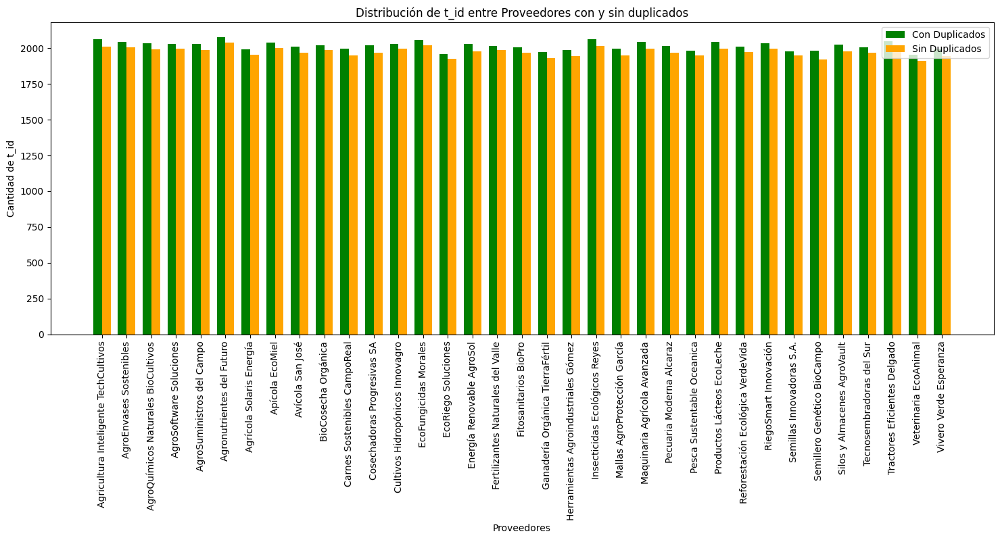

In [84]:
#Incluimos ahora una gráfica de matplotlib para poder ver los datos de los proveedores con y sin duplicados conjuntamente

# Configuración de la gráfica
fig, ax = plt.subplots(figsize=(18, 6))
bar_width = 0.35
index = range(len(df_dup_proveedor['proveedor']))
bar1 = ax.bar(index, df_dup_proveedor['t_id'], bar_width, label='Con Duplicados', color='green')
bar2 = ax.bar([i + bar_width for i in index], df_sin_dup_proveedor['t_id'], bar_width, label='Sin Duplicados', color='orange')

# Añadimos etiquetas y título
ax.set_xlabel('Proveedores')
ax.set_ylabel('Cantidad de t_id')
ax.set_title('Distribución de t_id entre Proveedores con y sin duplicados')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(df_dup_proveedor['proveedor'])
ax.legend()
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.show()

**Conclusiones:**

-Al analizar la distribución de los t_id duplicados entre nuestros proveedores observamos que los datos se siguen distribuyendo de una forma similar antes y después de eliminar los duplicados, un 3% aproximadamente de los datos pertenecen a cada proveedor, por lo que eliminarlos no va a desequilibrar nuestros datos.

-No eliminamos a ningún proveedor al prescindir de los duplicados, seguimos teniendo 34 proveedores en nuestra base de datos

-El total de filas duplicadas es de 1459 pero en cuanto a t_id únicos se trata de 597, lo que significa que vamos a trabajar con 597 menos t_id únicos.

-No hemos encontrado nulos en este archivo.



## 3.2.Venta-clientes

In [85]:
venta_cliente = pd.read_csv("venta_cliente_original.csv", sep=';')

In [86]:
#Creamos el dataframe para el archivo venta_clientes
df_cliente=pd.DataFrame(venta_cliente)
df_cliente

,Unnamed: 0,cliente,t_id,tiempo_venta,precio_venta,peso
0,0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...,...
70544,70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [87]:
#Eliminamos la columna de unnamed
df_cliente = df_cliente.drop("Unnamed: 0", axis=1)
df_cliente

,cliente,t_id,tiempo_venta,precio_venta,peso
0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...
70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [88]:
#Comprobamos los valores únicos de t_id y se obtiene el mismo resultado que para proveedores.
df_cliente_unico = df_cliente['t_id'].nunique()
print("Los valores únicos de t_id son:", df_cliente_unico)

Los valores únicos de t_id son: 69687


In [89]:
# Examinamos los duplicados, son 1459 filas.
dupli_clientes = df_cliente.duplicated(subset=['t_id'], keep=False)
print(df_cliente[dupli_clientes])

              cliente            t_id  tiempo_venta  precio_venta        peso
35      CompraMaestra  scene00826.png         531.0      4.371595  246.762913
53      CompraMaestra  scene02901.png         247.0      2.021173  326.248672
54      CompraMaestra  scene03221.png         394.0      4.810688  273.467470
55      CompraMaestra  scene04341.png          93.0      4.744500  265.930354
56      CompraMaestra  scene05301.png         154.0      2.819290  247.331985
...               ...             ...           ...           ...         ...
68950  Cosecha Fresca  scene10561.png         374.0      3.167849  116.507674
68951  Cosecha Fresca  scene11281.png         337.0      3.593211  467.689825
68952  Cosecha Fresca  scene12861.png         342.0      2.158558  366.422762
68953  Cosecha Fresca  scene12981.png          96.0      4.566155  350.865623
68954  Cosecha Fresca  scene13141.png         241.0      3.989087  338.228849

[1459 rows x 5 columns]


In [90]:
#Visualizamos los duplicados.
duplicados_clientes_vista = df_cliente.loc[df_cliente.duplicated(subset=['t_id'], keep=False)].sort_values(by='t_id')
duplicados_clientes_vista

,cliente,t_id,tiempo_venta,precio_venta,peso
12994,MaxiDescuentos,scene00001.png,607.0,3.434707,266.516858
29164,EcoMercado Sostenible,scene00001.png,600.0,3.721973,275.654639
49943,Distribuidora Nacional,scene00001.png,540.0,3.611309,285.607659
25414,La Gran Cosecha,scene00041.png,181.0,2.276226,260.957855
14757,Mercado del Barrio,scene00041.png,625.0,3.170058,266.467161
...,...,...,...,...,...
31185,EcoTienda,scene13721.png,688.0,2.910107,391.512999
58643,Central de Abastos Central,scene13741.png,218.0,4.107134,437.507520
8324,SuperEconómico,scene13741.png,649.0,2.396738,45.898604
18847,Almacén Estrella,scene13761.png,142.0,3.504713,444.198299


In [91]:
#Comprobamos cuantos de los duplicados son t_id únicos.
duplicados_clientes_vista['t_id'].nunique()

597

In [92]:
#Analizamos la distribucion de los clientes con los duplicados
df_dup_cliente = df_cliente.groupby('cliente')['t_id'].count().reset_index()
df_dup_cliente

,cliente,t_id
0,Alimentación Total,2090
1,Alimentos Premium,2055
2,Almacén Estrella,1982
3,Central de Abastos Central,2029
4,Comercial Fresco,2065
5,CompraMaestra,2029
6,CompraRápida,2051
7,Cosecha Fresca,2117
8,Delicias del Campo,2059
9,Distribuciones del Sol,2104


In [93]:
fig_pie_shipmode = px.pie(df_dup_cliente, values='t_id', names='cliente',
  title='Distribucion de clientes con duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [94]:
#Al eliminar duplicados nos quedamos con 69090 filas como en proveedores
df_cliente_unicos = df_cliente.drop_duplicates(subset=['t_id'], keep=False)
df_cliente_unicos

,cliente,t_id,tiempo_venta,precio_venta,peso
0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...
70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [95]:
#Comprobamos el numero de valores únicos después de eliminar los duplicados, coincide también con proveedores.
valores_unicos_cliente = df_cliente_unicos['t_id'].nunique()
print("Los valores únicos de t_id son:", valores_unicos_cliente)

Los valores únicos de t_id son: 69090


In [96]:
# Estudio de nulos
nulls = df_cliente_unicos.isnull().sum().sort_values()
notnull = df_cliente_unicos.notnull().sum().sort_values()
frame = { 'nulls': nulls, 'notnulls': notnull }
print(frame)

{'nulls': cliente           0
t_id              0
peso              0
tiempo_venta    218
precio_venta    675
dtype: int64, 'notnulls': precio_venta    68415
tiempo_venta    68872
cliente         69090
t_id            69090
peso            69090
dtype: int64}


In [97]:
df_final_cliente=df_cliente_unicos
df_final_cliente

,cliente,t_id,tiempo_venta,precio_venta,peso
0,CompraMaestra,Apple 1.png,437.0,4.909680,264.195357
1,CompraMaestra,Apple 10.png,259.0,3.425103,141.647327
2,CompraMaestra,Apple 135.png,388.0,3.468746,516.167670
3,CompraMaestra,Apple 218.png,484.0,4.345632,267.665780
4,CompraMaestra,Apple 304.png,638.0,3.709716,326.369599
...,...,...,...,...,...
70544,Cosecha Fresca,Tamotoes00677.png,423.0,4.207169,452.063145
70545,Cosecha Fresca,Tamotoes00730.png,620.0,4.639173,161.608887
70546,Cosecha Fresca,Tamotoes00765.png,333.0,2.359417,229.885578
70547,Cosecha Fresca,Tamotoes00815.png,526.0,3.176057,390.352480


In [98]:
#Analizamos la distribución de los clientes sin los duplicados
df_sin_dup_cliente = df_final_cliente.groupby('cliente')['t_id'].count().reset_index()
df_sin_dup_cliente

,cliente,t_id
0,Alimentación Total,2043
1,Alimentos Premium,2014
2,Almacén Estrella,1941
3,Central de Abastos Central,1989
4,Comercial Fresco,2020
5,CompraMaestra,1992
6,CompraRápida,2018
7,Cosecha Fresca,2073
8,Delicias del Campo,2004
9,Distribuciones del Sol,2055


In [99]:
fig_pie_shipmode = px.pie(df_sin_dup_cliente, values='t_id', names='cliente',
  title='Distribucion de clientes sin duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

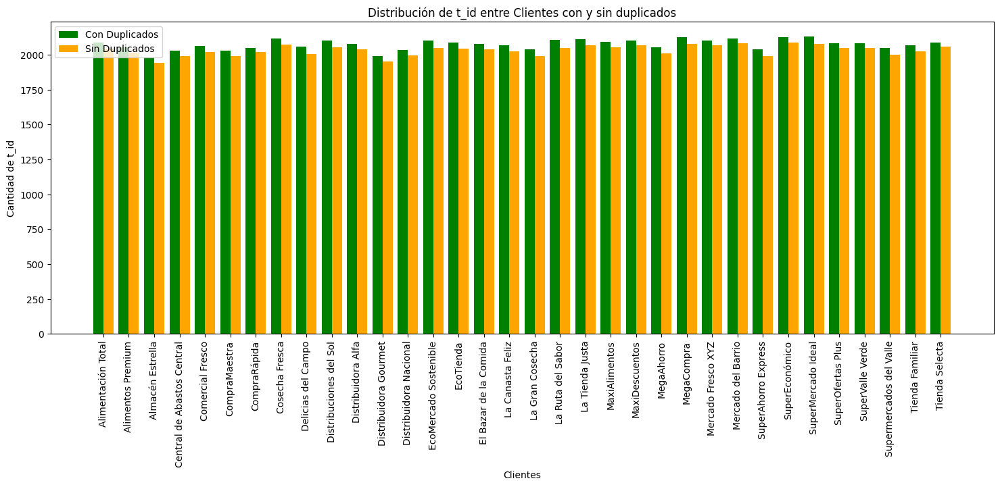

In [100]:
#Incluimos además una gráfica de matplotlib para poder ver los datos de los clientes con y sin duplicados conjuntamente

# Configuración de la gráfica
fig, ax = plt.subplots(figsize=(18, 6))
bar_width = 0.40
index = range(len(df_dup_cliente['cliente']))
bar1 = ax.bar(index, df_dup_cliente['t_id'], bar_width, label='Con Duplicados', color='green')
bar2 = ax.bar([i + bar_width for i in index], df_sin_dup_cliente['t_id'], bar_width, label='Sin Duplicados', color='orange')

# Añadimos etiquetas y título
ax.set_xlabel('Clientes')
ax.set_ylabel('Cantidad de t_id')
ax.set_title('Distribución de t_id entre Clientes con y sin duplicados')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(df_dup_cliente['cliente'])
ax.legend()
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.show()

**Conclusiones:**

-Hemos comprobado que al eliminar los t_id duplicados la distribución de nuestros clientes en cuanto al total sigue repartiendose de forma equitativa, cada cliente tiene alrededor del 3% de los t_id por lo que eliminar las filas duplicados no desequilibra la forma en la que se distribuyen los datos en nuestro data set.

-También seguimos teniendo el mismo número de clientes, 34 en este caso, es decir, al eliminar duplicados no eliminamos la información por completo de un cliente, lo cual podría haber sucedido si una gran parte de los duplicados pertenecieran a uno o varios clientes.

-Observamos 218 nulos en el tiempo_venta y 675 en el precio_venta. Los vamos a estudiar más adelante por lo que permanecen en nuestro dataframe de momento.

-En la información que se nos facilita sobre Pontia Logistica se menciona que si no tenemos datos de venta podemos asumir  que es porque esa fruta ha sido dañada y no se ha podido vender. Tendremos en cuenta esta información para análisis posteriores.

## 3.3.Tipo


In [101]:
tipo = pd.read_csv("tipo_original.csv", sep=';')

In [102]:
#Visualizamos el df de tipo
df_tipo=pd.DataFrame(tipo)
df_tipo

,Unnamed: 0,t_id,tipo,tiempo_recogida
0,0,Apple 1.png,Apple,433
1,1,Apple 10.png,Apple,252
2,2,Apple 100.png,Apple,442
3,3,Apple 101.png,Apple,647
4,4,Apple 102.png,Apple,418
...,...,...,...,...
70544,70544,Tamotoes00995.png,Tomatoes,614
70545,70545,Tamotoes00996.png,Tomatoes,433
70546,70546,Tamotoes00997.png,Tomatoes,432
70547,70547,Tamotoes00998.png,Tomatoes,497


In [103]:
#Eliminamos la columna de unnamed
df_tipo = df_tipo.drop("Unnamed: 0", axis=1)
df_tipo

,t_id,tipo,tiempo_recogida
0,Apple 1.png,Apple,433
1,Apple 10.png,Apple,252
2,Apple 100.png,Apple,442
3,Apple 101.png,Apple,647
4,Apple 102.png,Apple,418
...,...,...,...
70544,Tamotoes00995.png,Tomatoes,614
70545,Tamotoes00996.png,Tomatoes,433
70546,Tamotoes00997.png,Tomatoes,432
70547,Tamotoes00998.png,Tomatoes,497


In [104]:
#Comprobamos los valores unicos de t_id.
valores_unicos_tipo = df_tipo['t_id'].nunique()
print("Los valores únicos de t_id son:", valores_unicos_tipo)

Los valores únicos de t_id son: 69687


In [105]:
#Comprobamos los t_id duplicados.
duplicados_tipo = df_tipo.duplicated(subset=['t_id'], keep=False)
print(df_tipo[duplicados_tipo])

                 t_id   tipo  tiempo_recogida
1222   scene00201.png  Apple              175
1224   scene00401.png  Apple              512
1225   scene00451.png  Apple              296
1227   scene00501.png  Apple              692
1228   scene00526.png  Apple              501
...               ...    ...              ...
17713  scene13661.png  Guava              686
17714  scene13681.png  Guava              431
17716  scene13721.png  Guava               73
17717  scene13741.png  Guava              215
17718  scene13761.png  Guava              107

[1459 rows x 3 columns]


In [106]:
#Visualizamos los t_id duplicados
duplicados_vista_tipo = df_tipo.loc[df_tipo.duplicated(subset=['t_id'], keep=False)].sort_values(by='t_id')
duplicados_vista_tipo

,t_id,tipo,tiempo_recogida
1905,scene00001.png,Apple,531
5865,scene00001.png,Apple,589
17139,scene00001.png,Guava,604
5866,scene00041.png,Apple,609
17141,scene00041.png,Guava,174
...,...,...,...
17716,scene13721.png,Guava,73
2431,scene13741.png,Apple,640
17717,scene13741.png,Guava,215
2432,scene13761.png,Apple,132


In [107]:
#Vista de distribución de datos de frutas duplicadas
df_dup_tipo = duplicados_vista_tipo.groupby('tipo')['tipo'].count()
df_dup_tipo

tipo
Apple    947
Guava    512
Name: tipo, dtype: int64

In [108]:
#Analizamos la distribución de las frutas con los duplicados
df_dup_tipo = df_tipo.groupby('tipo')['t_id'].count().reset_index()
df_dup_tipo

,tipo,t_id
0,Apple,11185
1,Banana,3027
2,Carambola,2080
3,Guava,19698
4,Kiwi,8465
5,Mango,4154
6,Orange,3012
7,Peach,2629
8,Pear,3012
9,Persimmon,2072


In [109]:
fig_pie_shipmode = px.pie(df_dup_tipo, values='t_id', names='tipo',
  title='Distribucion de frutas con duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [110]:
#Al eliminar duplicados nos quedamos con 69090 filas como en el df1 y el df2.
df_unicos_tipo = df_tipo.drop_duplicates(subset=['t_id'], keep=False)
df_unicos_tipo

,t_id,tipo,tiempo_recogida
0,Apple 1.png,Apple,433
1,Apple 10.png,Apple,252
2,Apple 100.png,Apple,442
3,Apple 101.png,Apple,647
4,Apple 102.png,Apple,418
...,...,...,...
70544,Tamotoes00995.png,Tomatoes,614
70545,Tamotoes00996.png,Tomatoes,433
70546,Tamotoes00997.png,Tomatoes,432
70547,Tamotoes00998.png,Tomatoes,497


In [111]:
# Estudio de nulos.
nulls = df_unicos_tipo.isnull().sum().sort_values()
notnull = df_unicos_tipo.notnull().sum().sort_values()
frame = { 'nulls': nulls, 'notnulls': notnull }
print(frame)

{'nulls': t_id               0
tipo               0
tiempo_recogida    0
dtype: int64, 'notnulls': t_id               69090
tipo               69090
tiempo_recogida    69090
dtype: int64}


In [112]:
df_final_tipo=df_unicos_tipo
df_final_tipo

,t_id,tipo,tiempo_recogida
0,Apple 1.png,Apple,433
1,Apple 10.png,Apple,252
2,Apple 100.png,Apple,442
3,Apple 101.png,Apple,647
4,Apple 102.png,Apple,418
...,...,...,...
70544,Tamotoes00995.png,Tomatoes,614
70545,Tamotoes00996.png,Tomatoes,433
70546,Tamotoes00997.png,Tomatoes,432
70547,Tamotoes00998.png,Tomatoes,497


In [113]:
#Analizamos la distribución de las frutas sin los duplicados
df_sin_dup_tipo = df_final_tipo.groupby('tipo')['t_id'].count().reset_index()
df_sin_dup_tipo

,tipo,t_id
0,Apple,10238
1,Banana,3027
2,Carambola,2080
3,Guava,19186
4,Kiwi,8465
5,Mango,4154
6,Orange,3012
7,Peach,2629
8,Pear,3012
9,Persimmon,2072


In [114]:
fig_pie_shipmode = px.pie(df_sin_dup_tipo, values='t_id', names='tipo',
  title='Distribucion de frutas sin duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

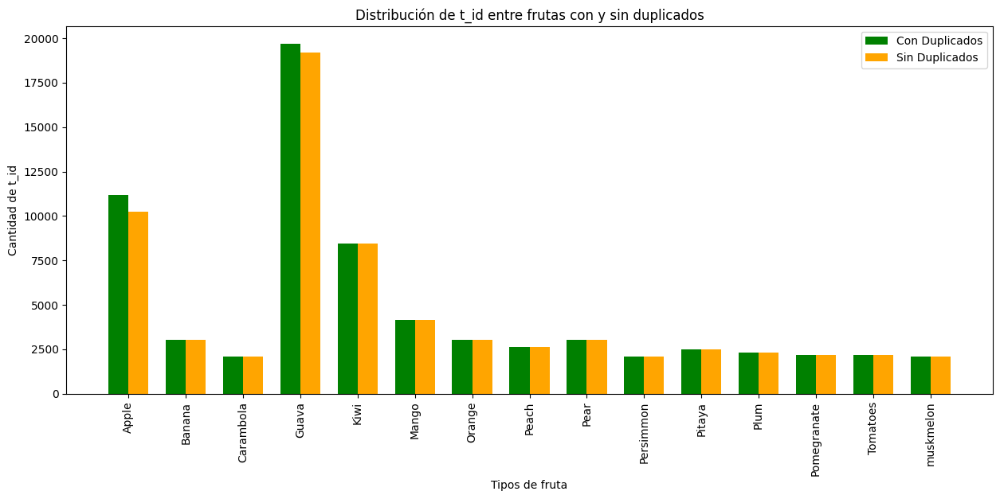

In [115]:
#Incluimos una grafica de matplotlib para poder ver los datos de frutas con y sin duplicados conjuntamente.

#Configuracion de la gráfica
fig, ax = plt.subplots(figsize=(15, 6))
bar_width = 0.35
index = range(len(df_dup_tipo['tipo']))
bar1 = ax.bar(index, df_dup_tipo['t_id'], bar_width, label='Con Duplicados', color='green')
bar2 = ax.bar([i + bar_width for i in index], df_sin_dup_tipo['t_id'], bar_width, label='Sin Duplicados', color='orange')

# Añadir etiquetas y título
ax.set_xlabel('Tipos de fruta')
ax.set_ylabel('Cantidad de t_id')
ax.set_title('Distribución de t_id entre frutas con y sin duplicados')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(df_dup_tipo['tipo'])
ax.legend()
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.show()

**Conclusiones:**

-En este caso los duplicados pertenecen solo a las frutas de Apple y Guava, asi que hemos examinado como afectaría su eliminación a nuestro dataset.

-Los datos se siguen distribuyendo de una forma parecida después de eliminar los duplicados de Guava y Apple, antes de eliminarlos representaban el 27.9% y el 15.9% de los datos respectivamente y despues de eliminar los docuplicaos el 27.8% y el 14.8% respectivamente.

-El número de tipo de frutas despues de eliminar duplicados también sigue siendo el mismo, 15 en este caso.

-Concluimos que proceedemos a eliminar los duplicados al igual que hicimos en los archivos anteriores porque no desequilibran nuestros datos y ademas tenemos los mismos t_id duplicados en todos los documentos como hemos comprobado anteriormente.

-No hemos encontrado nulos en este documento.

## 3.4.Info-lote

In [116]:
info_lote = pd.read_csv("info_lote_original.csv",sep=';')

In [117]:
df_lote=pd.DataFrame(info_lote)
df_lote

,Unnamed: 0,codigo_lote,t_id,marca,coste_inicial
0,0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...,...
70544,70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [118]:
df_lote=df_lote.drop('Unnamed: 0',axis=1)
df_lote

,codigo_lote,t_id,marca,coste_inicial
0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...
70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [119]:
#Comprobamos los valores únicos de t_id y se obtiene el mismo resultado que para los archivos anteriores.
valores_unicos_lote = df_lote['t_id'].nunique()
print("Los valores únicos de t_id son:", valores_unicos_lote)

Los valores únicos de t_id son: 69687


In [120]:
#Comprobamos los duplicados y al igual que anteriormente obtenemos 1459.
duplicados_lote= df_lote.duplicated(subset=['t_id'], keep=False)
print(df_lote[duplicados_lote])

                codigo_lote            t_id             marca  coste_inicial
1222  C67K78K48L50L49J80T71  scene00201.png   VibranteSabores       1.474485
1223  C67K78K48L50L49J80T71  scene00201.png     DeliciosoEdén       1.924915
1224  C67K78K48L50L49J80T71  scene00201.png     PaladarDorado       2.688805
1225  C67K78K48L50L49J80T71  scene00201.png  DulzuraSilvestre       2.420529
1227  C67K78K48L52L49J80T71  scene00401.png       JugosoAroma       2.514025
...                     ...             ...               ...            ...
6668  C67K78K48S52N49J80T71  scene07421.png       SaborNativo       2.863835
6669  C67K78K48S53L49J80T71  scene07501.png   FantasíaDelicia       1.892447
6670  C67K78K48S53L49J80T71  scene07501.png   VibranteSabores       2.594591
6671  C67K78K48S56P49J80T71  scene07841.png    FrescuraMágica       2.259416
6672  C67K78K48S56P49J80T71  scene07841.png   VibranteSabores       2.040088

[1459 rows x 4 columns]


In [121]:
#Visualizamos los duplicados
duplicados_vista_lote = df_lote.loc[df_lote.duplicated(subset=['t_id'], keep=False)].sort_values(by='t_id')
duplicados_vista_lote

,codigo_lote,t_id,marca,coste_inicial
2102,C67K78K48L48L49J80T71,scene00001.png,MaravillaJugosa,2.475298
2104,C67K78K48L48L49J80T71,scene00001.png,FrutaDulce,1.599100
2103,C67K78K48L48L49J80T71,scene00001.png,ManjarFruity,1.999103
6556,C67K78K48L48P49J80T71,scene00041.png,SabrosoEdén,2.025128
6557,C67K78K48L48P49J80T71,scene00041.png,RicoBosque,NaN
...,...,...,...,...
3198,C67K78K49O55N49J80T71,scene13721.png,FrescuraInigualable,2.961209
3199,C67K78K49O55P49J80T71,scene13741.png,CosechaDivina,1.535779
3200,C67K78K49O55P49J80T71,scene13741.png,RicoBosque,2.404460
3202,C67K78K49O55R49J80T71,scene13761.png,AventuraFrutal,2.786151


In [122]:
#Analizamos la distribución de los proveedors con duplicados
df_dup_marca = df_lote.groupby('marca')['t_id'].count().reset_index()
df_dup_marca

,marca,t_id
0,AromasCelestiales,1954
1,ArteFrutal,2004
2,AventuraFrutal,2030
3,BrisaFrutal,2045
4,CosechaDivina,2038
5,CítricosSelectos,2010
6,DeliciaNaturaleza,1952
7,DeliciosoEdén,2006
8,DulceEncanto,2056
9,DulzuraSilvestre,2016


In [123]:
fig_pie_shipmode = px.pie(df_dup_marca, values='t_id', names='marca',
  title='Distribucion de marcas con duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [124]:
#Al eliminar duplicados nos quedamos con 69090 filas como en los archivos anteriores.
df_lote_unicos = df_lote.drop_duplicates(subset=['t_id'], keep=False)
df_lote_unicos

,codigo_lote,t_id,marca,coste_inicial
0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...
70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [125]:
#Analizamos los nulos y obtenemos 1967 en la columna de 'coste_inicial. De momento no hacemos nada con ellos.
nulls = df_lote_unicos.isnull().sum().sort_values()
notnull = df_lote_unicos.notnull().sum().sort_values()
frame = { 'nulls': nulls, 'notnulls': notnull }
print(frame)

{'nulls': codigo_lote         0
t_id                0
marca               0
coste_inicial    1967
dtype: int64, 'notnulls': coste_inicial    67123
codigo_lote      69090
t_id             69090
marca            69090
dtype: int64}


In [126]:
df_final_lote=df_lote_unicos
df_final_lote

,codigo_lote,t_id,marca,coste_inicial
0,G80V76K49J80T71,Apple 1.png,ParaísoFrutal,2.642048
1,G80V76K49L46V78M,Apple 10.png,TropicalSabor,1.702296
2,G80V76K49L48J80T71,Apple 100.png,DeliciaNaturaleza,1.176703
3,G80V76K49L49J80T71,Apple 101.png,EmbrujoFrutal,2.314693
4,G80V76K49L50J80T71,Apple 102.png,ExóticoManjar,2.473541
...,...,...,...,...
70544,D65S79D79K83L48U57Q46V78M,Tamotoes00995.png,ArteFrutal,2.477602
70545,D65S79D79K83L48U57R46V78M,Tamotoes00996.png,FrescoDelValle,2.094206
70546,D65S79D79K83L48U57S46V78M,Tamotoes00997.png,ArteFrutal,2.332970
70547,D65S79D79K83L48U57T46V78M,Tamotoes00998.png,CosechaDivina,2.325945


In [127]:
#Analizamos la distribución de las marcas sin duplicados
df_sin_dup_marca = df_final_lote.groupby('marca')['t_id'].count().reset_index()
df_sin_dup_marca

,marca,t_id
0,AromasCelestiales,1930
1,ArteFrutal,1957
2,AventuraFrutal,1976
3,BrisaFrutal,1999
4,CosechaDivina,2001
5,CítricosSelectos,1972
6,DeliciaNaturaleza,1921
7,DeliciosoEdén,1961
8,DulceEncanto,2009
9,DulzuraSilvestre,1981


In [128]:
fig_pie_shipmode = px.pie(df_sin_dup_marca, values='t_id', names='marca',
  title='Distribucion de marcas sin duplicados', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

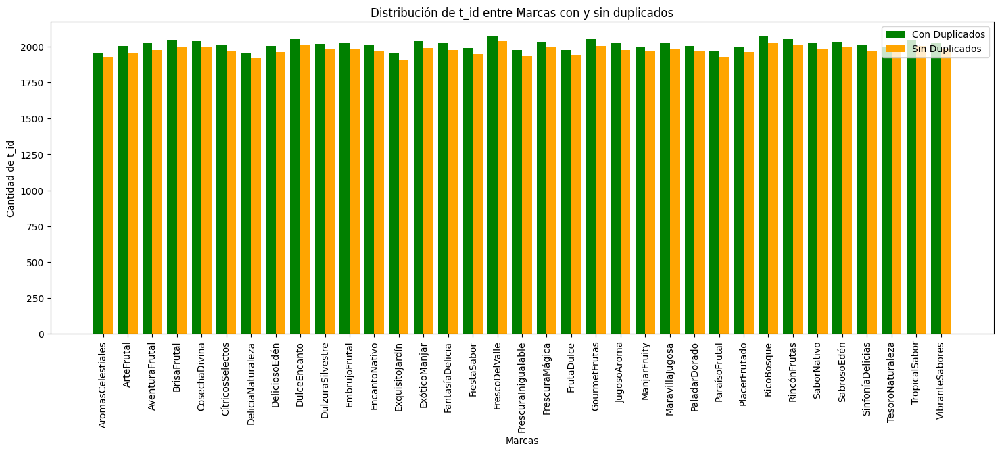

In [129]:
#Incluimos además una gráfica de matplotlib para poder ver los datos de las Marcas con y sin duplicados conjuntamente

# Configuración de la gráfica
fig, ax = plt.subplots(figsize=(18, 6))
bar_width = 0.40
index = range(len(df_dup_marca['marca']))
bar1 = ax.bar(index, df_dup_marca['t_id'], bar_width, label='Con Duplicados', color='green')
bar2 = ax.bar([i + bar_width for i in index], df_sin_dup_marca['t_id'], bar_width, label='Sin Duplicados', color='orange')

# Añadimos etiquetas y título
ax.set_xlabel('Marcas')
ax.set_ylabel('Cantidad de t_id')
ax.set_title('Distribución de t_id entre Marcas con y sin duplicados')
ax.set_xticks([i + bar_width / 2 for i in index])
ax.set_xticklabels(df_dup_marca['marca'])
ax.legend()
plt.xticks(rotation=90)

# Mostrar la gráfica
plt.show()

**Conclusiones:**

-Tenemos el mismo número de t_id duplicados en todos nuestros archivos, y suponen alrededor del 2% del total de nuestros datos.

-Se ha analizado la distribucion de la informacion de los t_id duplicados para proveedores, clientes, tipos de fruta y marca.

-No hemos encontrado una forma de seleccionar uno de los t_id duplicados y no otros ya que la información del resto de datos de la fila es diferente para cada uno de ellos, por lo que hemos procedido a eliminarlos después de comprobar que no desequilibra la forma en la que se distribuyen nuestros datos.

-Hemos encontrado nulos en el archivo de venta-cliente y de info-lote, de momento no hemos hecho nada con ellos porque los vamos a estudiar a continuación, el resto de archivos no contienen datos nulos

# **4.ESTUDIO DE LOS DATOS EN CONJUNTO**

## 4.1. Union de data frames

**Los datos:**

• **t_id:** identificador de la etiqueta del producto

•**tiempo_recogida:** unidad de tiempo (número entero) que representa el momento en
que se produce la recoge el alimento del proveedor agrícola contando el número de horas que han pasado desde las 07:00 del 1 de septiembre de 2022. Por ejemplo, si este campo indica un 8 significa que la recogida se produjo a las 15:00 (07:00 más 8 horas) del 1 de septiembre; mientras que si indica un 25 significa que se produjo a las 08:00 del 2 de septiembre de 2022 (25 horas después del momento de referencia).

• **tiempo_venta:** unidad de tiempo (igual que en el campo anterior) del momento en que el producto se pone a la venta a disposición del cliente final.

• **coste_inicial**: coste pagado al proveedor agrícola.

• **precio_venta:** precio de venta al supermercado o distribuidor final.

•**tipo:** tipo de fruta.

•**proveedor:** proveedor agrícola.

•**cliente:** supermercado o distribuidora final a la que se vende el producto.

**• peso:** peso en gramos del producto.

**• marca:** marca del producto.

**• lote:** código alfanumérico que identifica el lote en el que se ha distribuido el producto.

In [130]:
#Unimos los dataframes de proveedores y clientes por el t_id.
df_concat = pd.merge(df_final_proveedores[['t_id', 'proveedor']], df_final_cliente, on='t_id')
df_concat


,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729
...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998


In [131]:
#Unimos el dataframe 'tipo' al anterior.
df_concat2=pd.merge(df_concat, df_final_tipo, on='t_id')
df_concat2

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488
...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138


In [132]:
#Unimos el dataframe de 'lote' para conseguir nuestro dataframe completo.
df_final=pd.merge(df_concat2, df_final_lote, on='t_id')
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908
...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810


##4.2. Estudio de los datos

In [133]:
unique_proveedores = df_final['proveedor'].nunique()
print("El numero de proveedores que tenemos es de:", unique_proveedores)
unique_cliente = df_final['cliente'].nunique()
print("El numero de clientes que tenemos es de:", unique_cliente)
unique_marca = df_final['marca'].nunique()
print("El numero de marcas que tenemos es de:", unique_marca)
unique_tipo = df_final['tipo'].nunique()
print("El numero de frutas que tenemos es de:", unique_tipo)

El numero de proveedores que tenemos es de: 35
El numero de clientes que tenemos es de: 34
El numero de marcas que tenemos es de: 35
El numero de frutas que tenemos es de: 15


In [134]:
df_marcas_por_proveedor=df_final.groupby('proveedor')['marca'].nunique()
df_marcas_por_proveedor


proveedor
Agricultura Inteligente TechCultivos    35
AgroEnvases Sostenibles                 35
AgroQuímicos Naturales BioCultivos      35
AgroSoftware Soluciones                 35
AgroSuministros del Campo               35
Agronutrientes del Futuro               35
Agrícola Solaris Energía                35
Apícola EcoMiel                         35
Avícola San José                        35
BioCosecha Orgánica                     35
Carnes Sostenibles CampoReal            35
Cosechadoras Progresivas SA             35
Cultivos Hidropónicos Innovagro         35
EcoFungicidas Morales                   35
EcoRiego Soluciones                     35
Energía Renovable AgroSol               35
Fertilizantes Naturales del Valle       35
Fitosanitarios BioPro                   35
Ganadería Orgánica TierraFértil         35
Herramientas Agroindustriales Gómez     35
Insecticidas Ecológicos Reyes           35
Mallas AgroProtección García            35
Maquinaria Agrícola Avanzada            35
P

In [135]:
df_frutas_por_proveedor=df_final.groupby('proveedor')['tipo'].nunique()
df_frutas_por_proveedor

proveedor
Agricultura Inteligente TechCultivos    15
AgroEnvases Sostenibles                 15
AgroQuímicos Naturales BioCultivos      15
AgroSoftware Soluciones                 15
AgroSuministros del Campo               15
Agronutrientes del Futuro               15
Agrícola Solaris Energía                15
Apícola EcoMiel                         15
Avícola San José                        15
BioCosecha Orgánica                     15
Carnes Sostenibles CampoReal            15
Cosechadoras Progresivas SA             15
Cultivos Hidropónicos Innovagro         15
EcoFungicidas Morales                   15
EcoRiego Soluciones                     15
Energía Renovable AgroSol               15
Fertilizantes Naturales del Valle       15
Fitosanitarios BioPro                   15
Ganadería Orgánica TierraFértil         15
Herramientas Agroindustriales Gómez     15
Insecticidas Ecológicos Reyes           15
Mallas AgroProtección García            15
Maquinaria Agrícola Avanzada            15
P

In [136]:
df_marcas_por_cliente=df_final.groupby('cliente')['marca'].nunique()
df_marcas_por_cliente

cliente
Alimentación Total            35
Alimentos Premium             35
Almacén Estrella              35
Central de Abastos Central    35
Comercial Fresco              35
CompraMaestra                 35
CompraRápida                  35
Cosecha Fresca                35
Delicias del Campo            35
Distribuciones del Sol        35
Distribuidora Alfa            35
Distribuidora Gourmet         35
Distribuidora Nacional        35
EcoMercado Sostenible         35
EcoTienda                     35
El Bazar de la Comida         35
La Canasta Feliz              35
La Gran Cosecha               35
La Ruta del Sabor             35
La Tienda Justa               35
MaxiAlimentos                 35
MaxiDescuentos                35
MegaAhorro                    35
MegaCompra                    35
Mercado Fresco XYZ            35
Mercado del Barrio            35
SuperAhorro Express           35
SuperEconómico                35
SuperMercado Ideal            35
SuperOfertas Plus             35
Su

In [137]:
df_frutas_por_cliente=df_final.groupby('cliente')['tipo'].nunique()
df_frutas_por_cliente

cliente
Alimentación Total            15
Alimentos Premium             15
Almacén Estrella              15
Central de Abastos Central    15
Comercial Fresco              15
CompraMaestra                 15
CompraRápida                  15
Cosecha Fresca                15
Delicias del Campo            15
Distribuciones del Sol        15
Distribuidora Alfa            15
Distribuidora Gourmet         15
Distribuidora Nacional        15
EcoMercado Sostenible         15
EcoTienda                     15
El Bazar de la Comida         15
La Canasta Feliz              15
La Gran Cosecha               15
La Ruta del Sabor             15
La Tienda Justa               15
MaxiAlimentos                 15
MaxiDescuentos                15
MegaAhorro                    15
MegaCompra                    15
Mercado Fresco XYZ            15
Mercado del Barrio            15
SuperAhorro Express           15
SuperEconómico                15
SuperMercado Ideal            15
SuperOfertas Plus             15
Su

**Conclusiones:**

-Tanto los clientes como los proveedores trabajan con todas las marcas y tipos de fruta.

-Tenemos 35 proveedores y marcas, 34 clientes y 15 tipos de fruta.

##4.3. Estudio de la distribución de los datos en nuestro data frame

In [138]:
#Analizamos la distribución de las ventas a los clientes.
df_distribucion_ventas = df_final.groupby('cliente')['precio_venta'].sum().reset_index()
df_distribucion_ventas

,cliente,precio_venta
0,Alimentación Total,7042.158539
1,Alimentos Premium,6975.628177
2,Almacén Estrella,6751.494718
3,Central de Abastos Central,6924.724780
4,Comercial Fresco,6965.903479
5,CompraMaestra,6907.533678
6,CompraRápida,6999.227129
7,Cosecha Fresca,7215.119185
8,Delicias del Campo,6964.047169
9,Distribuciones del Sol,7147.972814


In [139]:
fig_pie_shipmode = px.pie(df_distribucion_ventas, values='precio_venta', names='cliente',
  title='Distribucion de Ventas por Cliente', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [140]:
#Analizamos la distribución de las compras a los proveedores.
df_distribucion_compras = df_final.groupby('proveedor')['coste_inicial'].sum().reset_index()
df_distribucion_compras

,proveedor,coste_inicial
0,Agricultura Inteligente TechCultivos,3884.868779
1,AgroEnvases Sostenibles,3890.746753
2,AgroQuímicos Naturales BioCultivos,3805.087962
3,AgroSoftware Soluciones,3824.658669
4,AgroSuministros del Campo,3858.585646
5,Agronutrientes del Futuro,3953.402661
6,Agrícola Solaris Energía,3754.399745
7,Apícola EcoMiel,3870.217273
8,Avícola San José,3858.593182
9,BioCosecha Orgánica,3867.201561


In [141]:
fig_pie_shipmode = px.pie(df_distribucion_compras, values='coste_inicial', names='proveedor',
  title='Distribucion de Compras por Proveedor', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [142]:
#Analizamos la distribución de las ventas por fruta
df_venta_fruta = df_final.groupby('tipo')['precio_venta'].sum().reset_index()
df_venta_fruta

,tipo,precio_venta
0,Apple,35373.712452
1,Banana,10452.832928
2,Carambola,7167.771499
3,Guava,66500.892291
4,Kiwi,29412.542589
5,Mango,14380.994254
6,Orange,10532.255315
7,Peach,9168.104892
8,Pear,10444.245029
9,Persimmon,7196.936022


In [143]:
fig_pie_shipmode = px.pie(df_venta_fruta, values='precio_venta', names='tipo',
  title='Distribucion de Ventas por Fruta', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

In [144]:
#Analizamos la distribución de las compras por fruta
df_compra_fruta = df_final.groupby('tipo')['coste_inicial'].sum().reset_index()
df_compra_fruta

,tipo,coste_inicial
0,Apple,19856.905829
1,Banana,5869.840813
2,Carambola,4032.107981
3,Guava,37345.829164
4,Kiwi,16506.398593
5,Mango,8092.343353
6,Orange,5863.319222
7,Peach,5123.813862
8,Pear,5820.072310
9,Persimmon,3992.802333


In [145]:
fig_pie_shipmode = px.pie(df_compra_fruta, values='coste_inicial', names='tipo',
  title='Distribucion de Compras por Fruta', color_discrete_sequence = px.colors.sequential.haline)
fig_pie_shipmode.show()

**Conclusiones:**

-Nuestros datos de comercialización, tanto por proveedor como por cliente se distribuyen de una forma bastante equitativa, hacemos alrededor del 3% de las compras o ventas totales a cada uno.

-Sin embargo en cuanto al tipo de fruta que comercializamos(datos muy similares para ventas y compras), casi el 30% es Guava, seguido por la Manzana, el Kiwi y el Mango con un porcentaje aproximado del 15%, 12% y 6% respectivamente. Tendremos que tener esto en cuento en el futuro a la hora de tratar nuestros datos.

-El resto de frutas se distribuyen de una forma mas equitativa, comercializamos entre el 3% y el 4% cada una de ellas tanto para las ventas como para las compras.

# 5.IDENTIFICACIÓN DE ERRORES E INCIDENCIAS

##  5.1.Como mínimo se tarda un día desde que la fruta se recoge hasta que llega al cliente final.

In [146]:
#Añadimos columnas 'f_recogida' y 'f_venta con formato fecha para la venta y recogida.
#El data frame original nos proporciona los datos en unidades de tiempo.
df_final['f_recogida'] = (pd.to_datetime('2022-09-01 07') + \
                            pd.to_timedelta(df_final['tiempo_recogida'], unit='h'))
df_final['f_venta'] = (pd.to_datetime('2022-09-01 07') + \
                            pd.to_timedelta(df_final['tiempo_venta'], unit='h'))
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00


In [147]:
# Analizamos los valores nulos en los tiempos de recogida y de venta
valores_nulos_recogida = df_final['tiempo_recogida'].isnull().sum()
valores_nulos_venta = df_final['tiempo_venta'].isnull().sum()

# Filtramos las filas donde 'f_venta' es nulo
f_venta_nulo = df_final[df_final['f_venta'].isnull()]

# Extraemos el día de las fechas de recogida
dias_recogida_nulo = f_venta_nulo['f_recogida'].dt.date

# Verificamos si todas las fechas son iguales, y entonces nos tendría que dar que solo hay 1 valor único
coinciden_mismo_dia = dias_recogida_nulo.nunique() == 1

if coinciden_mismo_dia:
    print("Todas las fechas de recogida coinciden en el mismo día.\n")
    fecha_unica = dias_recogida_nulo.iloc[0]
    print("La fecha es:", fecha_unica)
else:
    print("Las fechas de recogida no coinciden en el mismo día.\n")
    fechas_unicas = dias_recogida_nulo.unique()
    print("Las fechas únicas son:", fechas_unicas)

# Miramos si coindicen por tipo de fruta
fruta_en_nulo = f_venta_nulo['tipo']

coinciden_misma_fruta = fruta_en_nulo.nunique() == 1

if coinciden_misma_fruta:
    print("\nTodas las frutas de recogida coinciden en el mismo día.\n")
    fruta_unica = fruta_en_nulo.iloc[0]
    print("La fruta es:", fruta_unica)
else:
    print("\nLas frutas de recogida no coinciden en los nulos de tiempo de venta.\n")
    fruta_unica = fruta_en_nulo.unique()
    print("Las frutas únicas son:", fruta_unica)

# Miramos si coincide por proveedor
proveedor_nulo = f_venta_nulo['proveedor']

coinciden_mismo_proveedor = proveedor_nulo.nunique() == 1

if coinciden_mismo_proveedor:
    print("\nTodas los proveedores de recogida coinciden en el mismo día.\n")
    proveedor_unico = proveedor_nulo.iloc[0]
    print("El proveedor único es:", proveedor_unico)
else:
    print("\nLos proveedores de recogida no coinciden en los nulos de tiempo de venta.\n")
    proveedor_unico = proveedor_nulo.unique()
    print("El proveedor es:", proveedor_unico)

# Miramos si coinciden los clientes
cliente_nulo = f_venta_nulo['cliente']

coinciden_mismo_cliente = cliente_nulo.nunique() == 1

if coinciden_mismo_cliente:
    print("\nTodas los clientes de recogida coinciden en el mismo día.\n")
    cliente_unico = cliente_nulo.iloc[0]
    print("El cliente único es:", proveedor_unico)
else:
    print("\nLos clientes de recogida no coinciden en los nulos de tiempo de venta.\n")
    cliente_unico = cliente_nulo.unique()
    print("El cliente único es:", cliente_unico)

# Miramos si coinciden por marcas
marca_nulo = f_venta_nulo['marca']

coinciden_mismo_marca = marca_nulo.nunique() == 1

if coinciden_mismo_marca:
    print("\nTodas las marcas de recogida coinciden en el mismo día.\n")
    marca_unico = marca_nulo.iloc[0]
    print("La marca única es:", marca_unico)
else:
    print("\nLas marcas de recogida no coinciden en los nulos de tiempo de venta.\n")
    marca_unico = marca_nulo.unique()
    print("La marca única es:", marca_unico)

# Miramos si coincide por lote
lote_nulo = f_venta_nulo['codigo_lote']

coinciden_mismo_lote = lote_nulo.nunique() == 1

if coinciden_mismo_lote:
    print("\nTodos los lotes de recogida coinciden en el mismo día.\n")
    lote_unico = lote_nulo.iloc[0]
    print("El lote único es:", lote_unico)
else:
    print("\nLos lotes de recogida no coinciden en los nulos de tiempo de venta.\n")
    lote_unico = lote_nulo.unique()
    print("El lote único es:", lote_unico)

print("\nValores nulos en la columna tiempo_recogida:", valores_nulos_recogida)
print("Valores nulos en la columna tiempo_venta:", valores_nulos_venta)

Las fechas de recogida no coinciden en el mismo día.

Las fechas únicas son: [datetime.date(2022, 9, 1) datetime.date(2022, 9, 12)
 datetime.date(2022, 9, 29) datetime.date(2022, 9, 3)
 datetime.date(2022, 9, 11) datetime.date(2022, 9, 15)
 datetime.date(2022, 9, 10) datetime.date(2022, 9, 24)
 datetime.date(2022, 9, 14) datetime.date(2022, 9, 27)
 datetime.date(2022, 9, 19) datetime.date(2022, 9, 21)
 datetime.date(2022, 9, 2) datetime.date(2022, 9, 23)
 datetime.date(2022, 9, 6) datetime.date(2022, 9, 8)
 datetime.date(2022, 9, 22) datetime.date(2022, 9, 7)
 datetime.date(2022, 9, 16) datetime.date(2022, 9, 20)
 datetime.date(2022, 9, 4) datetime.date(2022, 9, 13)
 datetime.date(2022, 9, 17) datetime.date(2022, 9, 18)
 datetime.date(2022, 9, 5) datetime.date(2022, 9, 9)
 datetime.date(2022, 9, 25) datetime.date(2022, 10, 1)
 datetime.date(2022, 9, 30) datetime.date(2022, 9, 26)
 datetime.date(2022, 9, 28)]

Las frutas de recogida no coinciden en los nulos de tiempo de venta.

Las fru

In [148]:
# Vamos a comprobar si los nulos coinciden en fecha de recogida.

# Verificamos si los valores nulos en 'tiempo_venta' coinciden con la fecha de recogida en 'recogida'
# La última parte parace redundante, pero es para asegurar que ambos lados de la comparación estén en el mismo formato.
nulos_coinciden = df_final['f_venta'].isnull() & (df_final['f_recogida'].dt.date == df_final['f_recogida'].dt.date)

# Contamos los valores resultantes
num_nulos_coinciden = nulos_coinciden.sum()
print("Número de nulos en 'tiempo_venta' que coinciden en fecha de recogida:", num_nulos_coinciden)

Número de nulos en 'tiempo_venta' que coinciden en fecha de recogida: 218


In [149]:
# Eliminamos los nulos en la columna de "tiempo_venta".
df_final = df_final.dropna(subset=['tiempo_venta']).copy()
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00


A continuación vamos a analizar la diferencia entre el tiempo de venta y de recogida de la fruta.

In [150]:
# Restamos la variable de "tiempo_venta" con el "tiempo_recogida" para así ver si pasan 24h desde la recogida hasta la venta, y mostramos los erróneos
# Nos salen 68872 filas erroneas, eso quiere decir que no cumplen con las 24h de diferencia
df_final['diferencia_tiempo'] = df_final['tiempo_venta'] - df_final['tiempo_recogida']
df_filas_erroneas = df_final[df_final['diferencia_tiempo'] <= 24]
df_filas_erroneas

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,diferencia_tiempo
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,4.0
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00,6.0
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,4.0
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,5.0
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00,4.0
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00,9.0
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00,4.0
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00,7.0


In [151]:
# Aquí vamos a mostrar las filas que tienen como mínimo una diferencia de 24h entre la venta y la recogida
# Restamos la variable 'tiempo_venta' con 'tiempo_recogida' para obtener la diferencia de tiempo
df_final['diferencia_tiempo'] = df_final['tiempo_venta'] - df_final['tiempo_recogida']

# Seleccionamos las filas donde la diferencia de tiempo es mayor o igual a 24 horas
df_filas_correctas = df_final[df_final['diferencia_tiempo'] >= 24]

# Mostramos las filas que no son erróneas y nos damos cuenta que al poner esa condición nos quedamos sin información
df_filas_correctas

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,diferencia_tiempo


In [152]:
# Ahora estudiamos si las diferencias entre tiempo_venta y tiempo_recogida son negativas.
df_final['diferencia_tiempo'] = df_final['tiempo_venta'] - df_final['tiempo_recogida']
#Visualizamos los datos con diferencia de tiempo negativo, tenemos 740 filas.
df_negativos= df_final[df_final['diferencia_tiempo'] < 0]
df_negativos


,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,diferencia_tiempo
104,Apple F _0_1326.png,Agricultura Inteligente TechCultivos,CompraMaestra,141.0,3.010959,237.197828,Apple,143,G80V76K70O48O49O50R46V78M,ExóticoManjar,1.332931,2022-09-07 06:00:00,2022-09-07 04:00:00,-2.0
176,Apple 01714.png,Agricultura Inteligente TechCultivos,EcoTienda,-1.0,3.308094,252.344583,Apple,396,G80V76K48M55M52J80T71,SabrosoEdén,2.045948,2022-09-17 19:00:00,2022-09-01 06:00:00,-397.0
318,Banana01662.png,Agricultura Inteligente TechCultivos,Distribuidora Nacional,-1.0,4.491717,225.324985,Banana,555,H65T65T65L49R54N46V78M,AventuraFrutal,1.787782,2022-09-24 10:00:00,2022-09-01 06:00:00,-556.0
481,Guava1550.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,-1.0,3.818247,259.296847,Guava,546,M85G86G49Q53L46V78M,CosechaDivina,2.495916,2022-09-24 01:00:00,2022-09-01 06:00:00,-547.0
490,Guava392.png,Agricultura Inteligente TechCultivos,La Tienda Justa,-11.0,3.187988,310.948703,Guava,483,M85G86G51U50J80T71,AromasCelestiales,1.971972,2022-09-21 10:00:00,2022-08-31 20:00:00,-494.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68004,Guava02171.png,Fitosanitarios BioPro,CompraRápida,159.0,3.030202,534.907520,Guava,160,M85G86G48N49S49J80T71,BrisaFrutal,1.952747,2022-09-07 23:00:00,2022-09-07 22:00:00,-1.0
68011,Guava02356.png,Fitosanitarios BioPro,Distribuciones del Sol,-11.0,3.838682,413.806225,Guava,518,M85G86G48N51Q54J80T71,ParaísoFrutal,1.704159,2022-09-22 21:00:00,2022-08-31 20:00:00,-529.0
68425,Mango00520.png,Fitosanitarios BioPro,Tienda Selecta,-1.0,3.395309,194.615258,Mango,527,S65T71U48L53N48J80T71,CítricosSelectos,NaN,2022-09-23 06:00:00,2022-09-01 06:00:00,-528.0
68598,Orange00712.png,Fitosanitarios BioPro,CompraRápida,-8.0,4.250957,314.820484,Orange,679,U82G78M69L48S49N46V78M,AventuraFrutal,2.358817,2022-09-29 14:00:00,2022-08-31 23:00:00,-687.0


In [153]:
#Observamos que en muchos de los casos donde la diferencia de tiempo es negativo, el tiempo_venta original
#es negativo también, así que vamos a estudiar esto.
df_negativos2=df_negativos[df_negativos['tiempo_venta']<0]
df_negativos2

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,diferencia_tiempo
176,Apple 01714.png,Agricultura Inteligente TechCultivos,EcoTienda,-1.0,3.308094,252.344583,Apple,396,G80V76K48M55M52J80T71,SabrosoEdén,2.045948,2022-09-17 19:00:00,2022-09-01 06:00:00,-397.0
318,Banana01662.png,Agricultura Inteligente TechCultivos,Distribuidora Nacional,-1.0,4.491717,225.324985,Banana,555,H65T65T65L49R54N46V78M,AventuraFrutal,1.787782,2022-09-24 10:00:00,2022-09-01 06:00:00,-556.0
481,Guava1550.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,-1.0,3.818247,259.296847,Guava,546,M85G86G49Q53L46V78M,CosechaDivina,2.495916,2022-09-24 01:00:00,2022-09-01 06:00:00,-547.0
490,Guava392.png,Agricultura Inteligente TechCultivos,La Tienda Justa,-11.0,3.187988,310.948703,Guava,483,M85G86G51U50J80T71,AromasCelestiales,1.971972,2022-09-21 10:00:00,2022-08-31 20:00:00,-494.0
633,GuavaÒÇé1386 resized.png,Agricultura Inteligente TechCultivos,La Ruta del Sabor,-3.0,2.793084,412.888982,Guava,344,M85G86G210I201M51T54B69C73J69J46V78M,MaravillaJugosa,0.974581,2022-09-15 15:00:00,2022-09-01 04:00:00,-347.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67848,GuavaÒÇé2182.png,Fitosanitarios BioPro,SuperOfertas Plus,-1.0,3.633047,197.266529,Guava,307,M85G86G210I201N49T50J80T71,FrescoDelValle,2.188709,2022-09-14 02:00:00,2022-09-01 06:00:00,-308.0
68011,Guava02356.png,Fitosanitarios BioPro,Distribuciones del Sol,-11.0,3.838682,413.806225,Guava,518,M85G86G48N51Q54J80T71,ParaísoFrutal,1.704159,2022-09-22 21:00:00,2022-08-31 20:00:00,-529.0
68425,Mango00520.png,Fitosanitarios BioPro,Tienda Selecta,-1.0,3.395309,194.615258,Mango,527,S65T71U48L53N48J80T71,CítricosSelectos,NaN,2022-09-23 06:00:00,2022-09-01 06:00:00,-528.0
68598,Orange00712.png,Fitosanitarios BioPro,CompraRápida,-8.0,4.250957,314.820484,Orange,679,U82G78M69L48S49N46V78M,AventuraFrutal,2.358817,2022-09-29 14:00:00,2022-08-31 23:00:00,-687.0


In [154]:
#De los datos con diferencias negativas alrededor del 75% venían ya con un tiempo de venta negativo.

In [155]:
#Observamos como se distribuyen los negativos de diferencia de tiempo entre nuestos clientes
#y es bastante homogenea.
df_negativos.groupby(['cliente']).agg({'diferencia_tiempo':'count'})


,diferencia_tiempo
cliente,
Alimentación Total,16
Alimentos Premium,14
Almacén Estrella,21
Central de Abastos Central,29
Comercial Fresco,23
CompraMaestra,28
CompraRápida,18
Cosecha Fresca,26
Delicias del Campo,10


In [156]:
#Observamos como se distribuyen los negativos de diferencia de tiempo entre las frutas.
#La mayoría se dan en la Guava, seguido de Apple y Kiwi.
df_negativos.groupby(['tipo']).agg({'diferencia_tiempo':'count'})

,diferencia_tiempo
tipo,
Apple,113
Banana,27
Carambola,20
Guava,213
Kiwi,100
Mango,38
Orange,31
Peach,26
Pear,34


In [157]:
#Observamos como se distribuyen los negativos de diferencia de tiempo entre nuestos proveedores
#y es bastante homogenea al igual que entre los clientes.
df_negativos.groupby(['proveedor']).agg({'diferencia_tiempo':'count'})

,diferencia_tiempo
proveedor,
Agricultura Inteligente TechCultivos,13
AgroEnvases Sostenibles,17
AgroQuímicos Naturales BioCultivos,18
AgroSoftware Soluciones,29
AgroSuministros del Campo,16
Agronutrientes del Futuro,20
Agrícola Solaris Energía,20
Apícola EcoMiel,30
Avícola San José,21


In [158]:
# Seleccionamos las filas dónde la diferencia es mayor a 0.
df_final = df_final[df_final['diferencia_tiempo'] > 0]
# Borramos la columna de diferencia
df_final.drop(columns=['diferencia_tiempo'], inplace=True)
df_final

<ipython-input-158-41f893cbeac5>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00


**Conclusión:**

-Eliminamos los nulos en tiempo de venta ya que todos ocurren en el mismo día por lo que asumimos que se debe a un error de procesamiento en ese día concreto.

-Eliminamos los negativos ya que en ningún caso el tiempo de recogida puede ser posterior al de venta.

-Trabajaremos bajo la hipótesis de que como máximo se tarda 24horas desde que la fruta se recoge hasta que llega al cliente final, por las razones expuestas anteriormente.

## 5.2. A cada proveedor no se le pueden comprar en un mismo día más de 100kg de una misma fruta.

In [159]:
#Añadimos una columna con el peso en kg.
df_final['peso_kg']=df_final['peso']/1000
df_final

<ipython-input-159-414433371e38>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00,0.106158
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00,0.285102
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00,0.277565
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00,0.427957
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00,0.275593


In [160]:
#Creamos una columna llamada 'venta_dia' con el formato de fecha en 'Dia' en vez de 'Dia y Hora'
df_final['venta_dia'] = df_final['f_venta'].dt.date
df_final

<ipython-input-160-460aaefd125a>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,venta_dia
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,2022-09-19
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00,0.106158,2022-09-14
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,2022-09-11
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,2022-09-12
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,2022-09-21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00,0.285102,2022-09-19
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00,0.277565,2022-09-03
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00,0.427957,2022-09-22
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00,0.275593,2022-09-07


In [161]:
#Agrupamos por proveedor y venta para ver los kilos vendidos por dia.
df_ventas=df_final.groupby(['proveedor','venta_dia']).agg({"peso_kg": "sum"}).reset_index()
df_ventas

,proveedor,venta_dia,peso_kg
0,Agricultura Inteligente TechCultivos,2022-09-01,8.150668
1,Agricultura Inteligente TechCultivos,2022-09-02,13.934037
2,Agricultura Inteligente TechCultivos,2022-09-03,18.843938
3,Agricultura Inteligente TechCultivos,2022-09-04,16.376232
4,Agricultura Inteligente TechCultivos,2022-09-05,17.874499
...,...,...,...
1080,Vivero Verde Esperanza,2022-09-27,19.676980
1081,Vivero Verde Esperanza,2022-09-28,14.795548
1082,Vivero Verde Esperanza,2022-09-29,20.650213
1083,Vivero Verde Esperanza,2022-09-30,21.448160


In [162]:
#Filtramos los que nos dan un resultado mayor a 100 para ver si se cumple la condición.
df_ventas_100=df_ventas[df_ventas['peso_kg'] > 100]
df_ventas_100

,proveedor,venta_dia,peso_kg


In [163]:
# Borramos la columna de venta_dia.
df_final.drop(columns=['venta_dia'], inplace=True)
df_final

<ipython-input-163-3c2863bf3510>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00,0.106158
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00,0.285102
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00,0.277565
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00,0.427957
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00,0.275593


**Conclusión:**

Efectivamente a ningún proveedor se le ha comprado más de 100 kg de fruta en un mismo día.

## 5.3. No hay marcas que produzcan más de un tipo de fruta.

In [164]:
pd.set_option('display.max_rows', None)

In [165]:
df_final.groupby(['marca','tipo']).agg({'tipo':'count'})

tipo
marca               tipo             
AromasCelestiales   Apple         293
                    Banana         76
                    Carambola      60
                    Guava         518
                    Kiwi          219
                    Mango         112
                    Orange         94
                    Peach          65
                    Pear           87
                    Persimmon      54
                    Pitaya         68
                    Plum           62
                    Pomegranate    61
                    Tomatoes       50
                    muskmelon      41
ArteFrutal          Apple         275
                    Banana         79
                    Carambola      49
                    Guava         528
                    Kiwi          195
                    Mango         117
                    Orange         76
                    Peach          64
                    Pear           85
                    Persimmon      82
                    Pitaya         73
                    Plum           68
                    Pomegranate    77
                    Tomatoes       68
                    muskmelon      54
AventuraFrutal      Apple         279
                    Banana         77
                    Carambola      56
                    Guava         523
                    Kiwi          242
                    Mango         119
                    Orange         88
                    Peach          80
                    Pear           83
                    Persimmon      69
                    Pitaya         60
                    Plum           70
                    Pomegranate    52
                    Tomatoes       62
                    muskmelon      44
BrisaFrutal         Apple         305
                    Banana         75
                    Carambola      66
                    Guava         540
                    Kiwi          231
                    Mango         112
                    Orange         88
                    Peach          59
                    Pear           78
                    Persimmon      52
                    Pitaya         78
                    Plum           53
                    Pomegranate    64
                    Tomatoes       82
                    muskmelon      57
CosechaDivina       Apple         279
                    Banana         99
                    Carambola      52
                    Guava         529
                    Kiwi          234
                    Mango         105
                    Orange         90
                    Peach          74
                    Pear           94
                    Persimmon      54
                    Pitaya         63
                    Plum           73
                    Pomegranate    78
                    Tomatoes       65
                    muskmelon      51
CítricosSelectos    Apple         304
                    Banana         80
                    Carambola      62
                    Guava         519
                    Kiwi          229
                    Mango         113
                    Orange         93
                    Peach          78
                    Pear           86
                    Persimmon      51
                    Pitaya         66
                    Plum           57
                    Pomegranate    60
                    Tomatoes       52
                    muskmelon      56
DeliciaNaturaleza   Apple         292
                    Banana         90
                    Carambola      67
                    Guava         490
                    Kiwi          243
                    Mango         115
                    Orange         60
                    Peach          78
                    Pear           87
                    Persimmon      43
                    Pitaya         72
                    Plum           54
                    Pomegranate    54
                    Tomatoes       56
     

In [166]:
pd.reset_option('display.max_rows')

**Conclusión:**

Aunque se indica que no hay marcas que produzcan más de un tipo de fruta,al analizar los datos hemos comprobado que, al contrario de lo indicado, cada marca produce todas las frutas.
Por lo que consideramos que no hay marcas que produzcan un solo tipo de fruta y procederemos a tratar los datos de esta forma.

## 5.4.Un mismo lote no puede tener marcas o frutas distintas.

In [167]:
# Observamos que los codigo_lote repetidos se asocian a dos t_id muy parecidos
df_final[df_final['codigo_lote'].duplicated(keep=False)].sort_values('codigo_lote')[['codigo_lote', 't_id', 'tipo', 'marca']]

,codigo_lote,t_id,tipo,marca
7897,G80V76K69L48M46V78M,applee001.png,Apple,GourmetFrutas
47518,G80V76K69L48M46V78M,Apple E001.png,Apple,TesoroNaturaleza
15797,G80V76K69L48N46V78M,applee002.png,Apple,SabrosoEdén
51449,G80V76K69L48N46V78M,Apple E002.png,Apple,AromasCelestiales
59363,G80V76K69L48O46V78M,Apple E003.png,Apple,ExquisitoJardín
...,...,...,...,...
25700,G80V76K69L57M56Q46V78M,applee09185.png,Apple,MaravillaJugosa
37569,G80V76K69L57M56R46V78M,Apple E09186.png,Apple,FantasíaDelicia
15799,G80V76K69L57M56R46V78M,applee09186.png,Apple,PlacerFrutado
47523,G80V76K69L57M56S46V78M,Apple E09187.png,Apple,ExóticoManjar


In [168]:
# Comprobamos que todos los codigo_lote duplicados están asociados a un solo tipo de fruta, 'Apple'
df_final[df_final['codigo_lote'].duplicated(keep=False)]['tipo'].unique()

array(['Apple'], dtype=object)

In [169]:
# Y que los codigo_lote duplicados únicos son 115
df_final[df_final['codigo_lote'].duplicated(keep=False)]['codigo_lote'].nunique()

115

In [170]:
# Se confirma que hay 115 pares iguales codigo_lote-tipo
df_final[df_final['codigo_lote'].duplicated(keep=False)][['codigo_lote', 'tipo']].duplicated(keep=False).sum()

230

In [171]:
# Al incorporar la marca solo en 10 filas se cumple que el código lote se asocia a la misma marca
df_final[df_final['codigo_lote'].duplicated(keep=False)][['codigo_lote', 'marca']].duplicated(keep=False).sum()

10

**Conclusiones:**

-Se comprueba que ningún codigo_lote tiene más de un tipo de fruta, pero en la mayoría de los casos los codigo_lote repetidos sí están relacionados con más de una marca.

-Los codigos lotes asociados a más de una fruta tienen t_id distintos aunque parecidos, además se asocian a diferentes marcas por lo que mantendremos estos datos.

# 6.INCORPORAMOS ÚLTIMAS CONDICIONES COMO LA DEL PESO Y EL COSTE INICIAL

## 6.1. Convertimos los pesos negativos a positivo

In [172]:
# Verificar si hay pesos negativos, y nos encontramos con 107 filas que tienen peso negativo
# Decidimos convertir los pesos a valor positivo
pesos_negativos = df_final[df_final['peso'] < 0]
pesos_negativos

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
151,Apple F770.png,Agricultura Inteligente TechCultivos,Distribuciones del Sol,562.0,3.593772,-66.097484,Apple,557,G80V76K70S55L46V78M,ArteFrutal,2.052410,2022-09-24 12:00:00,2022-09-24 17:00:00,-0.066097
155,Apple.png,Agricultura Inteligente TechCultivos,EcoTienda,629.0,2.872869,-67.222202,Apple,622,G80V76K46V78M,PaladarDorado,2.033327,2022-09-27 05:00:00,2022-09-27 12:00:00,-0.067222
691,GuavaÒÇé1865 resized.png,Agricultura Inteligente TechCultivos,Mercado Fresco XYZ,219.0,3.756204,-7.758434,Guava,210,M85G86G210I201M56R53B69C73J69J46V78M,TesoroNaturaleza,2.231737,2022-09-10 01:00:00,2022-09-10 10:00:00,-0.007758
945,Guava03332.png,Agricultura Inteligente TechCultivos,Alimentación Total,712.0,2.960197,-9.077053,Guava,706,M85G86G48O51O50J80T71,RicoBosque,1.629749,2022-09-30 17:00:00,2022-09-30 23:00:00,-0.009077
1229,Kiwi00660.png,Agricultura Inteligente TechCultivos,Distribuidora Nacional,394.0,2.396435,-23.304431,Kiwi,386,Q73G73L48R54L46V78M,DulceEncanto,0.650061,2022-09-17 09:00:00,2022-09-17 17:00:00,-0.023304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66878,Pitaya00220.png,Reforestación Ecológica VerdeVida,SuperAhorro Express,150.0,3.434207,-30.276502,Pitaya,145,V73D65I65L48N50L46V78M,ExóticoManjar,1.499214,2022-09-07 08:00:00,2022-09-07 13:00:00,-0.030277
67880,GuavaÒÇé2439 resized.png,Fitosanitarios BioPro,CompraRápida,697.0,3.905813,-67.089851,Guava,689,M85G86G210I201N52O57B69C73J69J46V78M,PaladarDorado,1.828100,2022-09-30 00:00:00,2022-09-30 08:00:00,-0.067090
68111,Kiwi A00572.png,Fitosanitarios BioPro,SuperEconómico,481.0,2.089795,-54.747303,Kiwi,478,Q73G73G48L53S50J80T71,EmbrujoFrutal,1.102463,2022-09-21 05:00:00,2022-09-21 08:00:00,-0.054747
68542,Orange001746.png,Fitosanitarios BioPro,Central de Abastos Central,26.0,3.550237,-16.299895,Orange,21,U82G78M69L48M55P54J80T71,FrutaDulce,1.488790,2022-09-02 04:00:00,2022-09-02 09:00:00,-0.016300


In [173]:
# Convertimos todos los pesos negativos en positivos, y volvemos a imprimir por pantalla el dataframe
df_final['peso'] = df_final['peso'].abs()
df_final

<ipython-input-173-8a8875248c76>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
1,Apple 109.png,Agricultura Inteligente TechCultivos,Almacén Estrella,323.0,3.821524,106.158018,Apple,317,G80V76K49L57J80T71,RicoBosque,2.601399,2022-09-14 12:00:00,2022-09-14 18:00:00,0.106158
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69085,Tamotoes00759.png,Fitosanitarios BioPro,Almacén Estrella,429.0,2.811979,285.101844,Tomatoes,425,D65S79D79K83L48S53U46V78M,RicoBosque,1.506829,2022-09-19 00:00:00,2022-09-19 04:00:00,0.285102
69086,Tamotoes00772.png,Fitosanitarios BioPro,SuperValle Verde,61.0,2.769113,277.564672,Tomatoes,52,D65S79D79K83L48S55N46V78M,AventuraFrutal,1.524607,2022-09-03 11:00:00,2022-09-03 20:00:00,0.277565
69087,Tamotoes00804.png,Fitosanitarios BioPro,El Bazar de la Comida,520.0,3.569035,427.957340,Tomatoes,516,D65S79D79K83L48T48P46V78M,ManjarFruity,2.792150,2022-09-22 19:00:00,2022-09-22 23:00:00,0.427957
69088,Tamotoes00807.png,Fitosanitarios BioPro,El Bazar de la Comida,145.0,2.257043,275.592998,Tomatoes,138,D65S79D79K83L48T48S46V78M,RicoBosque,1.042810,2022-09-07 01:00:00,2022-09-07 08:00:00,0.275593


In [174]:
# Confirmamos que ahora no tenemos ningún valor negativo en los pesos
pesos_negativos = df_final[df_final['peso']<0].shape[0]
print(f"Tenemos {pesos_negativos} pesos negativos.")

Tenemos 0 pesos negativos.


## 6.2. Para rellenar los nulos del coste inicial, utilizamos el rango intercuartílico

In [175]:
# Calculamos el coste_inicial/peso y lo guardamos en una nueva columna 'coste_inicial_por_peso'
df_final['coste_inicial_por_peso'] = df_final['coste_inicial'] / df_final['peso_kg']

# Agrupamos por cada fruta y calculamos la media
media_por_fruta = df_final.groupby('tipo')['coste_inicial_por_peso'].mean()

# Agrupamos por cada fruta y calculamos la mediana
mediana_por_fruta = df_final.groupby('tipo')['coste_inicial_por_peso'].median()

print(media_por_fruta)
print(mediana_por_fruta)

tipo
Apple           7.796147
Banana          6.021843
Carambola       6.800436
Guava           7.673659
Kiwi            8.148099
Mango          11.137245
Orange          7.603459
Peach           7.523777
Pear            7.685981
Persimmon       7.820394
Pitaya          7.597384
Plum            8.170384
Pomegranate     7.205287
Tomatoes       10.518829
muskmelon       7.147242
Name: coste_inicial_por_peso, dtype: float64
tipo
Apple          6.626910
Banana         6.698588
Carambola      6.607920
Guava          6.648822
Kiwi           6.645108
Mango          6.688016
Orange         6.631638
Peach          6.841774
Pear           6.660456
Persimmon      6.566060
Pitaya         6.723060
Plum           6.745309
Pomegranate    6.502047
Tomatoes       6.654300
muskmelon      6.566193
Name: coste_inicial_por_peso, dtype: float64


<ipython-input-175-d92029f719ee>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [176]:
# Calculamos el rango intercuartílico
# Hacemos un función donde se calcula el rango intercuartílico y los límites superior e inferior
# Esta función va a recibir una serie con las variables de 'coste_inicial_por_peso' para cada tipo de fruta

def calcular_limites_iqr(serie):
    Q1 = serie.quantile(0.25)
    Q3 = serie.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    return lower_limit, upper_limit

# Calculamos los límites inferiores y superiores basados en el rango intercuartílico para la columna 'coste_inicial_por_peso'
# agrupada por el tipo de fruta
# el 'apply' aplica la función a la columna 'coste_inicial_por_peso' de cada tipo de fruta
# el resultado de 'limites_iqr' es una Serie donde el índice es el tipo de fruta y los valores son tuplas con los límites inferior y superior
limites_iqr = df_final.groupby('tipo')['coste_inicial_por_peso'].apply(calcular_limites_iqr)


In [177]:
# Después de sacar los límites inferior y superior en forma de tupla para cada tipo de fruta, los convertimos en series de
# dos elementos. El resultado será un DataFrame con los límites en las columnas y las frutas de índice
limites_iqr = limites_iqr.apply(pd.Series)
limites_iqr.columns = ['lower_limit', 'upper_limit']
print(limites_iqr)

             lower_limit  upper_limit
tipo                                 
Apple          -0.918033    14.921392
Banana         -0.562386    14.599506
Carambola      -0.594126    14.642411
Guava          -0.708538    14.729989
Kiwi           -0.700052    14.666290
Mango          -0.833111    14.876464
Orange         -0.766396    14.803166
Peach          -0.926993    14.927718
Pear           -0.804159    14.844163
Persimmon      -0.640722    14.505565
Pitaya         -0.779822    14.773885
Plum           -0.992006    15.200359
Pomegranate    -0.774505    14.452474
Tomatoes       -0.770099    14.847398
muskmelon      -0.881394    14.761110


In [178]:
# Unimos el dataframe de los límites con el dataframe original en base al 'tipo'
# Filtramos los datos y nos quedamos solo los que estén dentro del rango entre el límite inferior y el superior
df_final = df_final.merge(limites_iqr, on='tipo')

#Guardamos en una variable los outliers
outliers = df_final[(df_final['coste_inicial_por_peso'] < df_final['lower_limit']) | (df_final['coste_inicial_por_peso'] > df_final['upper_limit'])]

#Guardamos en una variable los valores que son nulos en el coste inicial
num_nulos = df_final[df_final['coste_inicial_por_peso'].isnull()]

#Filtramos para los valores que estén dentro del rango intercuartílico y que no son nulos
df_sin_outliers = df_final[(df_final['coste_inicial_por_peso'] >= df_final['lower_limit']) & (df_final['coste_inicial_por_peso'] <= df_final['upper_limit'])]
df_sin_outliers

# Guardar los índices de los outliers y valores nulos para luego poder recuperar esas filas
indices_outliers = outliers.index
indices_nulos = num_nulos.index


In [179]:
# Agrupamos por cada fruta y calculamos la media, entre los valores que están dentro del rango intercuartílico
media_por_fruta = df_sin_outliers.groupby('tipo')['coste_inicial_por_peso'].mean()
media_por_fruta

tipo
Apple          6.915517
Banana         6.917473
Carambola      6.856366
Guava          6.903092
Kiwi           6.875002
Mango          6.928139
Orange         6.881149
Peach          6.965406
Pear           6.936889
Persimmon      6.811449
Pitaya         6.916683
Plum           7.001011
Pomegranate    6.725496
Tomatoes       6.940841
muskmelon      6.824707
Name: coste_inicial_por_peso, dtype: float64

In [180]:
# Volvemos a concatenar los nulos y los outliers en el dataframe, para volver a tener el dataframe original y completo

# Recuperar los datos de los outliers y valores nulos
outliers_recuperados = df_final.loc[indices_outliers]
nulos_recuperados = df_final.loc[indices_nulos]

df_final = pd.concat([df_sin_outliers, outliers_recuperados, nulos_recuperados])
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,coste_inicial_por_peso,lower_limit,upper_limit
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,10.000357,-0.918033,14.921392
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,5.204132,-0.918033,14.921392
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,5.935251,-0.918033,14.921392
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,4.873256,-0.918033,14.921392
5,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169,6.748545,-0.918033,14.921392
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66701,Tamotoes00142.png,EcoRiego Soluciones,Distribuidora Alfa,512.0,2.997256,180.270357,Tomatoes,510,D65S79D79K83L48M52N46V78M,AromasCelestiales,NaN,2022-09-22 13:00:00,2022-09-22 15:00:00,0.180270,NaN,-0.770099,14.847398
66748,Tamotoes00128.png,Reforestación Ecológica VerdeVida,Tienda Selecta,441.0,1.950085,428.684597,Tomatoes,433,D65S79D79K83L48M50T46V78M,FrescoDelValle,NaN,2022-09-19 08:00:00,2022-09-19 16:00:00,0.428685,NaN,-0.770099,14.847398
66757,Tamotoes001583.png,Reforestación Ecológica VerdeVida,SuperAhorro Express,502.0,2.486626,372.147086,Tomatoes,491,D65S79D79K83L48M53T51J80T71,ArteFrutal,NaN,2022-09-21 18:00:00,2022-09-22 05:00:00,0.372147,NaN,-0.770099,14.847398
66759,Tamotoes00164.png,Reforestación Ecológica VerdeVida,Almacén Estrella,258.0,4.185953,285.876887,Tomatoes,250,D65S79D79K83L48M54P46V78M,RincónFrutas,NaN,2022-09-11 17:00:00,2022-09-12 01:00:00,0.285877,NaN,-0.770099,14.847398


In [181]:
# Vamos a rellenar los nulos del coste inicial con el valor medio del coste por unidad de cada tipo de fruta, por su peso
# Multiplicamos el peso por la media del coste inicial por kilogramo, del tipo de fruta correspondiente
coste_inicial_calculado = df_final['peso_kg'] * df_final['tipo'].map(media_por_fruta)

In [182]:
# Reemplaza los valores nulos por lo calculado en el 'coste_inicial_calculado'
df_final['coste_inicial'] = df_final['coste_inicial'].fillna(coste_inicial_calculado)

In [183]:
# Eliminamos las tres últimas columnas que no las vamos a utilizar de momento.

df_final = df_final.drop(columns=['coste_inicial_por_peso', 'lower_limit', 'upper_limit'])
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
5,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66701,Tamotoes00142.png,EcoRiego Soluciones,Distribuidora Alfa,512.0,2.997256,180.270357,Tomatoes,510,D65S79D79K83L48M52N46V78M,AromasCelestiales,1.251228,2022-09-22 13:00:00,2022-09-22 15:00:00,0.180270
66748,Tamotoes00128.png,Reforestación Ecológica VerdeVida,Tienda Selecta,441.0,1.950085,428.684597,Tomatoes,433,D65S79D79K83L48M50T46V78M,FrescoDelValle,2.975431,2022-09-19 08:00:00,2022-09-19 16:00:00,0.428685
66757,Tamotoes001583.png,Reforestación Ecológica VerdeVida,SuperAhorro Express,502.0,2.486626,372.147086,Tomatoes,491,D65S79D79K83L48M53T51J80T71,ArteFrutal,2.583014,2022-09-21 18:00:00,2022-09-22 05:00:00,0.372147
66759,Tamotoes00164.png,Reforestación Ecológica VerdeVida,Almacén Estrella,258.0,4.185953,285.876887,Tomatoes,250,D65S79D79K83L48M54P46V78M,RincónFrutas,1.984226,2022-09-11 17:00:00,2022-09-12 01:00:00,0.285877


In [184]:
# Miramos cuantos nulos tenemos en la columna de 'coste_inicial'
nulos_coste_inicial = df_final['coste_inicial'].isnull().sum()
nulos_coste_inicial

0

**Conclusiones:**

- Los pesos negativos se han convertido a positivos porque un peso no puede ser negativo, y visualizando los datos observamos que los pesos en negativo se asemejan a los pesos para esos tipos de fruta en positivo, por lo que asumimos que se ha tratado de un error de procesamiento de la información.

- No se nos ha dado información respecto a los costes nulos, por lo que para no perder esos datos los hemos sustituido por el coste medio por fruta usando el rango intercuartilico para sacar los outliers de los cálculos.

# 7.CREAMOS UN .CSV DEL DF FINAL PARA SQL Y HERRAMIENTAS DE VISUALIZACIÓN.

In [185]:
df_final.to_csv('vision_artificial_SQL.csv', sep=';', index=False)

In [186]:
#Para abrir el csv vision_artificial tenemos que usar el argumento (sep=';') ya que se guardó
#usando ese argumento de separación de columnas.

# 8.CREAMOS UN .CSV DE NUESTRO DATA FRAME PARA MODELOS DE PREDICCIÓN.

In [187]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66874 entries, 0 to 66813
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   t_id             66874 non-null  object        
 1   proveedor        66874 non-null  object        
 2   cliente          66874 non-null  object        
 3   tiempo_venta     66874 non-null  float64       
 4   precio_venta     66221 non-null  float64       
 5   peso             66874 non-null  float64       
 6   tipo             66874 non-null  object        
 7   tiempo_recogida  66874 non-null  int64         
 8   codigo_lote      66874 non-null  object        
 9   marca            66874 non-null  object        
 10  coste_inicial    66874 non-null  float64       
 11  f_recogida       66874 non-null  datetime64[ns]
 12  f_venta          66874 non-null  datetime64[ns]
 13  peso_kg          66874 non-null  float64       
dtypes: datetime64[ns](2), float64(5), int64(1),

In [188]:
df_final.head()

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
2,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
3,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
4,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
5,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169


##8.1.Sustituimos los precios de venta nulos por un promedio del precio por fruta usando el rango intercuatílico.

In [189]:
# Calculamos el precio_venta/peso y lo guardamos en una nueva columna 'precio_venta_por_peso'
df_final['precio_venta_por_peso'] = df_final['precio_venta'] / df_final['peso_kg']
df_final.head()

# Agrupamos por cada fruta y calculamos la media
media_precio_fruta = df_final.groupby('tipo')['precio_venta_por_peso'].mean()

# Agrupamos por cada fruta y calculamos la mediana
mediana_precio_fruta = df_final.groupby('tipo')['precio_venta_por_peso'].median()
print('Media del precio de venta por fruta es:')
print(media_precio_fruta)
print('Mediana del precio de venta por fruta es:')
print(mediana_precio_fruta)

Media del precio de venta por fruta es:
tipo
Apple          13.695386
Banana         10.761953
Carambola      11.702723
Guava          13.343002
Kiwi           14.242679
Mango          18.112186
Orange         13.361697
Peach          13.236893
Pear           13.488826
Persimmon      13.815994
Pitaya         13.402522
Plum           14.229660
Pomegranate    12.830783
Tomatoes       17.156960
muskmelon      12.664200
Name: precio_venta_por_peso, dtype: float64
Mediana del precio de venta por fruta es:
tipo
Apple          11.566228
Banana         11.652652
Carambola      11.606585
Guava          11.608093
Kiwi           11.662612
Mango          11.592325
Orange         11.755851
Peach          11.694562
Pear           11.763912
Persimmon      11.460404
Pitaya         11.759402
Plum           11.639891
Pomegranate    11.522064
Tomatoes       11.641881
muskmelon      11.594600
Name: precio_venta_por_peso, dtype: float64


In [190]:
# Calculamos el rango intercuartílico
# Hacemos un función donde se calcula el rango intercuartílico y los límites superior e inferior
# Esta función va a recibir una serie con las variables de 'precio_venta_por_peso' para cada tipo de fruta

def calcular_limites_iqr(serie):
    Q1 = serie.quantile(0.25)
    Q3 = serie.quantile(0.75)
    IQR = Q3 - Q1
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR
    return lower_limit, upper_limit

# Calculamos los límites inferiores y superiores basados en el rango intercuartílico para la columna 'coste_inicial_por_peso'
# agrupada por el tipo de fruta
# el 'apply' aplica la función a la columna 'coste_inicial_por_peso' de cada tipo de fruta
# el resultado de 'limites_iqr' es una Serie donde el índice es el tipo de fruta y los valores son tuplas con los límites inferior y superior
limites_iqr = df_final.groupby('tipo')['precio_venta_por_peso'].apply(calcular_limites_iqr)

In [191]:
# Después de sacar los límites inferior y superior en forma de tupla para cada tipo de fruta, los convertimos en series de
# dos elementos. El resultado será un DataFrame con los límites en las columnas y las frutas de índice
limites_iqr = limites_iqr.apply(pd.Series)
limites_iqr.columns = ['lower_limit', 'upper_limit']
print(limites_iqr)

             lower_limit  upper_limit
tipo                                 
Apple          -0.627137    24.982626
Banana         -0.234923    24.717668
Carambola      -0.258885    24.600576
Guava          -0.391371    24.875328
Kiwi           -0.642454    25.220710
Mango          -1.020174    25.554357
Orange         -0.187870    24.615426
Peach          -0.375134    25.010087
Pear           -0.546704    25.427096
Persimmon      -0.292167    24.603157
Pitaya         -0.373519    25.038099
Plum           -1.532852    26.246462
Pomegranate    -0.086608    24.360246
Tomatoes       -0.158516    24.471359
muskmelon       0.089430    24.204649


In [192]:
# Unimos el dataframe de los límites con el dataframe original en base al 'tipo'
# Filtramos los datos y nos quedamos solo los que estén dentro del rango entre el límite inferior y el superior
df_final = df_final.merge(limites_iqr, on='tipo')

#Guardamos en una variable los outliers
outliers = df_final[(df_final['precio_venta_por_peso'] < df_final['lower_limit']) | (df_final['precio_venta_por_peso'] > df_final['upper_limit'])]

#Guardamos en una variable los valores que son nulos en el coste inicial
num_nulos = df_final[df_final['precio_venta_por_peso'].isnull()]

#Filtramos para los valores que esten dentro del rango intercuartílico y que no son nulos
df_sin_outliers = df_final[(df_final['precio_venta_por_peso'] >= df_final['lower_limit']) & (df_final['precio_venta_por_peso'] <= df_final['upper_limit'])]
df_sin_outliers

# Guardar los índices de los outliers y valores nulos para luego poder recuperar esas filas
indices_outliers = outliers.index
indices_nulos = num_nulos.index

In [193]:
# Agrupamos por cada fruta y calculamos la media, entre los valores que estan dentro del rango intercuartílico
media_precio_fruta = df_sin_outliers.groupby('tipo')['precio_venta_por_peso'].mean()
media_precio_fruta

tipo
Apple          12.044996
Banana         12.071685
Carambola      11.963048
Guava          12.072140
Kiwi           12.080801
Mango          12.137188
Orange         12.105855
Peach          12.180927
Pear           12.211997
Persimmon      12.002034
Pitaya         12.163355
Plum           12.146896
Pomegranate    11.894637
Tomatoes       11.993682
muskmelon      11.866293
Name: precio_venta_por_peso, dtype: float64

In [194]:
# Volvemos a concatenar los nulos y los outliers en el dataframe, para volver a tener el dataframe original y completo

# Recuperar los datos de los outliers y valores nulos
outliers_recuperados = df_final.loc[indices_outliers]
nulos_recuperados = df_final.loc[indices_nulos]

df_final = pd.concat([df_sin_outliers, outliers_recuperados, nulos_recuperados])
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,precio_venta_por_peso,lower_limit,upper_limit
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,18.583521,-0.627137,24.982626
1,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,7.252238,-0.627137,24.982626
2,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,10.158139,-0.627137,24.982626
3,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,9.095216,-0.627137,24.982626
4,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169,15.471032,-0.627137,24.982626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66237,Tamotoes00502.png,Vivero Verde Esperanza,Alimentos Premium,469.0,NaN,408.257765,Tomatoes,460,D65S79D79K83L48Q48N46V78M,VibranteSabores,1.881890,2022-09-20 11:00:00,2022-09-20 20:00:00,0.408258,NaN,-0.158516,24.471359
66333,Tamotoes001976.png,Maquinaria Agrícola Avanzada,SuperOfertas Plus,92.0,NaN,176.414075,Tomatoes,88,D65S79D79K83L48M57S54J80T71,FrutaDulce,2.146202,2022-09-04 23:00:00,2022-09-05 03:00:00,0.176414,NaN,-0.158516,24.471359
66370,Tamotoes001359.png,AgroSuministros del Campo,Tienda Familiar,95.0,NaN,345.315057,Tomatoes,88,D65S79D79K83L48M51Q57J80T71,BrisaFrutal,2.754140,2022-09-04 23:00:00,2022-09-05 06:00:00,0.345315,NaN,-0.158516,24.471359
66572,Tamotoes00826.png,EcoRiego Soluciones,SuperValle Verde,228.0,NaN,293.282035,Tomatoes,223,D65S79D79K83L48T50R46V78M,AventuraFrutal,2.000661,2022-09-10 14:00:00,2022-09-10 19:00:00,0.293282,NaN,-0.158516,24.471359


In [195]:
# Vamos a rellenar los nulos del precio de venta con el valor medio del precio por unidad de cada tipo de fruta, por su peso
# Multiplicamos el peso por la media del precio de venta por kilogramo, del tipo de fruta correspondiente
precio_venta_calculado = df_final['peso_kg'] * df_final['tipo'].map(media_precio_fruta)

In [196]:
# Reemplaza los valores nulos por lo calculado en el 'precio_venta_calculado'
df_final['precio_venta'] = df_final['precio_venta'].fillna(precio_venta_calculado)

In [197]:
df_final.head()

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,precio_venta_por_peso,lower_limit,upper_limit
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,18.583521,-0.627137,24.982626
1,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,7.252238,-0.627137,24.982626
2,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,10.158139,-0.627137,24.982626
3,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,9.095216,-0.627137,24.982626
4,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169,15.471032,-0.627137,24.982626


In [198]:
# Eliminamos las dos últimas columnas que no las vamos a utilizar más

df_final = df_final.drop(columns=['lower_limit', 'upper_limit', 'precio_venta_por_peso'])
df_final

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195
1,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294
2,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743
3,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954
4,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66237,Tamotoes00502.png,Vivero Verde Esperanza,Alimentos Premium,469.0,4.896514,408.257765,Tomatoes,460,D65S79D79K83L48Q48N46V78M,VibranteSabores,1.881890,2022-09-20 11:00:00,2022-09-20 20:00:00,0.408258
66333,Tamotoes001976.png,Maquinaria Agrícola Avanzada,SuperOfertas Plus,92.0,2.115854,176.414075,Tomatoes,88,D65S79D79K83L48M57S54J80T71,FrutaDulce,2.146202,2022-09-04 23:00:00,2022-09-05 03:00:00,0.176414
66370,Tamotoes001359.png,AgroSuministros del Campo,Tienda Familiar,95.0,4.141599,345.315057,Tomatoes,88,D65S79D79K83L48M51Q57J80T71,BrisaFrutal,2.754140,2022-09-04 23:00:00,2022-09-05 06:00:00,0.345315
66572,Tamotoes00826.png,EcoRiego Soluciones,SuperValle Verde,228.0,3.517531,293.282035,Tomatoes,223,D65S79D79K83L48T50R46V78M,AventuraFrutal,2.000661,2022-09-10 14:00:00,2022-09-10 19:00:00,0.293282


In [199]:
# Miramos cuantos nulos tenemos en la columna de 'precio_venta'
nulos_precio_venta = df_final['precio_venta'].isnull().sum()
nulos_precio_venta

0

##8.2. Volvemos a añadir las columas de precio y coste por peso, una vez sustituidos los nulos.

In [200]:
# Calculamos el coste_inicial/peso y lo guardamos en una nueva columna 'coste_peso'
df_final['coste_peso'] = df_final['coste_inicial'] / df_final['peso_kg']
df_final.head()

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,coste_peso
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,10.000357
1,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,5.204132
2,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,5.935251
3,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,4.873256
4,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169,6.748545


In [201]:
# Calculamos el precio_venta/peso y lo guardamos en una nueva columna 'precio_peso'
df_final['precio_peso'] = df_final['precio_venta'] / df_final['peso_kg']
df_final.head()

,t_id,proveedor,cliente,tiempo_venta,precio_venta,peso,tipo,tiempo_recogida,codigo_lote,marca,coste_inicial,f_recogida,f_venta,peso_kg,coste_peso,precio_peso
0,Apple 1.png,Agricultura Inteligente TechCultivos,CompraMaestra,437.0,4.909680,264.195357,Apple,433,G80V76K49J80T71,ParaísoFrutal,2.642048,2022-09-19 08:00:00,2022-09-19 12:00:00,0.264195,10.000357,18.583521
1,Apple 205.png,Agricultura Inteligente TechCultivos,EcoMercado Sostenible,244.0,2.228573,307.294472,Apple,240,G80V76K50L53J80T71,DulceEncanto,1.599201,2022-09-11 07:00:00,2022-09-11 11:00:00,0.307294,5.204132,7.252238
2,Apple 240.png,Agricultura Inteligente TechCultivos,Cosecha Fresca,260.0,3.237831,318.742542,Apple,255,G80V76K50P48J80T71,ManjarFruity,1.891817,2022-09-11 22:00:00,2022-09-12 03:00:00,0.318743,5.935251,10.158139
3,Apple 25.png,Agricultura Inteligente TechCultivos,Central de Abastos Central,496.0,3.865046,424.953729,Apple,488,G80V76K50Q46V78M,TropicalSabor,2.070908,2022-09-21 15:00:00,2022-09-21 23:00:00,0.424954,4.873256,9.095216
4,Apple 253.png,Agricultura Inteligente TechCultivos,El Bazar de la Comida,493.0,3.344356,216.168894,Apple,486,G80V76K50Q51J80T71,SabrosoEdén,1.458826,2022-09-21 13:00:00,2022-09-21 20:00:00,0.216169,6.748545,15.471032


In [202]:
#Visualizamos la información de nuestro df y ahora no tenemos ningún dato nulo.
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66874 entries, 0 to 66739
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   t_id             66874 non-null  object        
 1   proveedor        66874 non-null  object        
 2   cliente          66874 non-null  object        
 3   tiempo_venta     66874 non-null  float64       
 4   precio_venta     66874 non-null  float64       
 5   peso             66874 non-null  float64       
 6   tipo             66874 non-null  object        
 7   tiempo_recogida  66874 non-null  int64         
 8   codigo_lote      66874 non-null  object        
 9   marca            66874 non-null  object        
 10  coste_inicial    66874 non-null  float64       
 11  f_recogida       66874 non-null  datetime64[ns]
 12  f_venta          66874 non-null  datetime64[ns]
 13  peso_kg          66874 non-null  float64       
 14  coste_peso       66874 non-null  float64   

La razón por la que primero creamos las columnas de precio y coste por peso, después las eliminamos, y ahora las volvemos a añadir, es porque inicialmente se calculan usando como base un precio de venta y coste inicial que contienen nulos.

Una vez sustituidos los nulos por su media volvemos a calcular los precios y costes por peso y a añadir esas columnas.

##8.3.Generamos nuevas columnas que utilizaremos en los modelos de clasificación, codificaremos las columnas categóricas, y redondearemos datos numéricos

In [203]:
# Ponemos en una columnas, dif, la diferencia entre tiempo_venta y tiempo_recogida
df_final['dif'] = df_final['tiempo_venta'] - df_final['tiempo_recogida']
# La hora del día de recogida
df_final['hora_recogida'] = df_final['f_recogida'].dt.hour
# El día de la semana de recogida
df_final['dia_sem_recogida'] = df_final['f_recogida'].dt.dayofweek
# Eliminamos las columnas que no vamos a utilizar
df_final.drop(['t_id', 'codigo_lote', 'coste_inicial', 'precio_venta', 'f_recogida', 'f_venta', 'peso_kg'], axis=1, inplace=True)

Codificación de variables categóricas

In [204]:
from sklearn.preprocessing import LabelEncoder
class_encoder = LabelEncoder()
# Codificación de la variable de salida (tipo)
df_encoded_y = class_encoder.fit_transform(df_final['tipo'])
# Guardamos el encoder para poderlo utilizar posterioremente
import joblib
joblib.dump(class_encoder, 'class_encoder.pkl')
# Codificamos las columnas categóricas con pd.get_dummies. Así es mas fácil identificar las que corresponden a cada variable
# no es necesario eliminar las columnas originales porque get.dummies las elimina.
df_encoded = pd.get_dummies(df_final, columns=['marca', 'proveedor', 'cliente', 'hora_recogida', 'dia_sem_recogida']).drop(
    'tipo', axis=1).join(pd.DataFrame(df_encoded_y, columns=['tipo']))

Redondeamos valores numéricos

In [205]:
df_encoded[['coste_peso', 'precio_peso']] = df_encoded[['coste_peso', 'precio_peso',]].round(4)
df_encoded['peso'] = df_encoded['peso'].round(1)

In [206]:
df_encoded

,tiempo_venta,peso,tiempo_recogida,coste_peso,precio_peso,dif,marca_AromasCelestiales,marca_ArteFrutal,marca_AventuraFrutal,marca_BrisaFrutal,...,hora_recogida_22,hora_recogida_23,dia_sem_recogida_0,dia_sem_recogida_1,dia_sem_recogida_2,dia_sem_recogida_3,dia_sem_recogida_4,dia_sem_recogida_5,dia_sem_recogida_6,tipo
0,437.0,264.2,433,10.0004,18.5835,4.0,False,False,False,False,...,False,False,True,False,False,False,False,False,False,0
1,244.0,307.3,240,5.2041,7.2522,4.0,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0
2,260.0,318.7,255,5.9353,10.1581,5.0,False,False,False,False,...,True,False,False,False,False,False,False,False,True,0
3,496.0,425.0,488,4.8733,9.0952,8.0,False,False,False,False,...,False,False,False,False,True,False,False,False,False,0
4,493.0,216.2,486,6.7485,15.4710,7.0,False,False,False,False,...,False,False,False,False,True,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66237,469.0,408.3,460,4.6096,11.9937,9.0,False,False,False,False,...,False,False,False,True,False,False,False,False,False,0
66333,92.0,176.4,88,12.1657,11.9937,4.0,False,False,False,False,...,False,True,False,False,False,False,False,False,True,1
66370,95.0,345.3,88,7.9757,11.9937,7.0,False,False,False,True,...,False,True,False,False,False,False,False,False,True,2
66572,228.0,293.3,223,6.8216,11.9937,5.0,False,False,True,False,...,False,False,False,False,False,False,False,True,False,4


##8.4.Generamos el .csv que vamos a usar para trabajar con machine learning

In [207]:
df_encoded.to_csv('vision_artificial_ML.csv', sep=';', index=False)

In [208]:
#Para abrir el csv vision_artificial tenemos que usar el argumento (sep=';') ya que se guardó
#usando ese argumento de separación de columnas.

**Conclusiones:**

-Generamos un nuevo .csv en el que añadimos las columnas precio de venta por peso y coste incial por peso ya que contienen información importante para trabajar con Machine Learning.

-Sustituimos los nulos en precio de venta por un promedio del precio de venta por fruta usando el rango intercuartilico. No lo hicimos asi para trabajar en SQL porque para responder las preguntas de negocio se consideraba esa fruta como dañada por lo que no se vendió, pero para trabajar en ML poner esos precios a 0 podría confundir a nuestro modelo, por lo que se han sustituido por la media.

-Creamos columnas nuevas relacionadas con el tiempo de venta y recogida para el uso como variales en los modelos de predicción.

-Codificamos las columnas categóricas con get dummies.


# 9.CONCLUSIONES FINALES

-Se han usado diferentes métodos de conversion de archivos .json a data frames, que han sido posteriormente extraídos a archivos .csv.

-Hemos analizado los duplicados, nulos y la distribución de nuestros datos tanto por proveedores, clientes, marcas y tipos de fruta como por costes y ventas.

-Concluimos con dos archivos .csv, uno de ellos más adecuado para responder a preguntas de negocio y el otro para trabajar con métodos de predicción.

-Para trabajar con el Modelo de Clasificación necesitaremos descargar los archivos class_encoder.pkl y vision_artificial_ML.

-El documento vision_artificial_SQL.csv se usará para extraer las tablas de SQL y también para trabajar con Tableu y Power BI.